# **Students Performance Dataset Final Report:**

---




# **1. Problem:**

Academic performance plays a key role in shaping students’ future paths and opportunities. In this project, we aim to study various student-related factors—such as study time, absences, parental support, and participation in extracurricular activities—to understand how they influence academic performance. By identifying the most impactful attributes, we hope to support early interventions for struggling students and help improve overall educational outcomes.

# **2. Data Mining Task:**

The goal of this project is to apply data mining techniques—classification and clustering—to analyze and predict student performance levels based on multiple features.

For classification, the target variable is GradeClass, which represents students’ academic performance based on their GPA. Initially, the dataset included five separate grade categories, but due to performance limitations in the classification model, some categories were later merged (e.g., top-performing students) to improve accuracy and learning ability. Details of this merging are explained in the later phases.

Clustering is used to explore hidden patterns and group students based on similarities in their behavior and background, without relying on grade labels. This provides deeper insights into how different groups of students perform and what characteristics define each group.

# **3. Data:**

**Dataset source:** Dataset source: Kaggle – Students Performance Dataset

General information about the dataset:

**Data distribution:**


| Grade Class | Number of Students |
|-------------|--------------------|
| A (0)       | 107                |
| B (1)       | 269                |
| C (2)       | 391                |
| D (3)       | 414                |
| F (4)       | 1211               |


**Number of students** (objects): 35880

**Number of attributes**: 15

**Target label**: GradeClass (based on GPA classification)



In [1]:
import pandas as pd

# إذا عندك الداتا محفوظة بملف CSV مثلاً
df = pd.read_csv('/content/Processed_dataset (3).csv')  # غيري اسم الملف حسب اسمك

# نحسب عدد القريدات المختلفة
grade_counts = df['GradeClass'].value_counts().sort_index()

print(grade_counts)


GradeClass
0     107
1     269
2     391
3     414
4    1211
Name: count, dtype: int64


**Red Dataset :**

In [ ]:
from google.colab import drive

In [ ]:
drive.amount('/content/drive')

In [ ]:
import pandas as pd

df = pd.read_csv('/content/Student_performance_data _ (2).csv')
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df.info()

### Attributes data types:

| Attribute Name      | Data Type           | Possible Values                              |
|---------------------|---------------------|-----------------------------------------------|
| student_id          | Nominal          | Unique ID for each student  ranging from 1001 to 3392                  |
| gender              | Binary (symmetric)  | Male, Female   0,1                               |
| race/ethnicity      | Nominal         | Group 0:Caucasian, 1:African American, 2:Asian, 3:Other,                            |
| parental_level_of_education | (Ordinal) |  0: None,1: High School,2: Some Colleg,3: Bachelor’s Degree,4: Highere    |
| StudyTimeWeekly               | Numeric (ratio-scaled)         | ranging from 0 to 20                        |
|  Absences | Numeric (ratio-scaled).     | ranging from 0 to 30.                               |
| Tutoring          |  Binary (asymmetric).     |  0: No,1: Yes                                  |
| ParentalSupport       | Ordinal     |  0: None,1: Low,2: Moderate,3: High, 4: Very High                                         |
| Extracurricular       |Binary (asymmetric)     | 0: No,1: Yes                                         |
| Sports          | Binary (asymmetric).     | 0: No,1: Yes                      |
| Music  | Binary (asymmetric).              | 0: No,1: Yes                                |
| Volunteering       |Binary (asymmetric).            |0: No,1: Yes                                |
| GPA     |Numeric (interval-scaled).             | 0: No,1: Yes                                |
| GradeClass | Ordinal              |  0: ‘A’ (GPA ≥ 3.5),1: ‘B’ (3.0 ≤ GPA < 3.5),2: ‘C’ (2.5 ≤ GPA < 3.0),3: ‘D’ (2.0 ≤ GPA < 2.5),4: ‘F’ (GPA < 2.0)                               |
| Age          | Numeric (ratio-scaled)         |  ranging from 15 to 18.    |


**to find duplicate objects:**

In [ ]:
df = pd.read_csv('AfterCorrelation_dataset.csv')

df_dublicate = df.drop(columns=['StudentID'])

duplicates = df_dublicate.duplicated(keep=False)

print("Number of dublicate rows:", duplicates.sum())




**to count null values:**

In [ ]:

missing_values = df.drop(columns=["StudentID"]).isnull().sum() # Show the number of missing values per column
print("\n missing_values")
print(missing_values)


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, precision_score, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
!pip install kneed
from kneed import KneeLocator
import pickle
from sklearn.preprocessing import MinMaxScaler
import numpy as np


**Smapling:**

In [ ]:
import pandas as pd

df = pd.read_csv('/content/Student_performance_data _ (2).csv')

print("Original class distribution:\n", df['GradeClass'].value_counts())

min_class_count = df['GradeClass'].value_counts().min()

balanced_sample = pd.concat([
    df[df['GradeClass'] == grade].sample(min_class_count, random_state=42)
    for grade in df['GradeClass'].unique()
])

print("Balanced sample class distribution:\n", balanced_sample['GradeClass'].value_counts())

print(balanced_sample.head())
df.to_csv("Sampled_dataset.csv", index=False)

Original class distribution:
 GradeClass
4.0    1211
3.0     414
2.0     391
1.0     269
0.0     107
Name: count, dtype: int64
Balanced sample class distribution:
 GradeClass
2.0    107
1.0    107
4.0    107
3.0    107
0.0    107
Name: count, dtype: int64
      StudentID  Age  Gender  Ethnicity  ParentalEducation  StudyTimeWeekly  \
43         1044   18       1          0                  1        18.245091   
217        1218   15       1          0                  2        10.731564   
173        1174   18       1          0                  2        18.812800   
1925       2926   15       1          0                  3        15.840063   
2296       3297   15       0          1                  1        17.679956   

      Absences  Tutoring  ParentalSupport  Extracurricular  Sports  Music  \
43           9         0                2                0       1      0   
217          6         0                0                1       0      1   
173          9         0              


Show the Min., 1st Qu., Median, Mean, 3rd Qu., Max., Mode:
Using the describe() function, we can extract key summary statistics. From these values, several important observations and mode values can be made:

- Student ID: A unique identifier assigned to each student, ranging from 1001 to 3392.  


- Gender: Gender is a binary variable (0 for Male, 1 for Female). The mode is 1, indicating that females are more represented compared to males.  
- Age:The ages range from 15 to 18 years, with a median of 16 years and a mean of approximately 16.2 years. The mode is 16 years, suggesting that the majority of students are around this age.  
- Ethnicity:The ethnicity of students is categorized as follows:  
  - 0: Caucasian  
  - 1: African American  
  - 2: Asian  
  - 3: Other  
  The mode is 0, indicating that most students belong to the Caucasian category.  
- Parental Education:The highest education level attained by parents, coded as follows:  
  - 0: None  
  - 1: High School  
  - 2: Some College  
  - 3: Bachelor's  
  - 4: Higher  
  The mode is 1, indicating that most parents have completed high school.  

- Study Time Weekly:Study time varies between 0 to 20 hours per week, with a median of 10 hours and a mean of 12.3 hours. The mode is 8 hours, indicating that most students dedicate around 8 hours per week to studying.  
- Absences: The number of absences ranges from 0 to 30, with a median of 6 and a mean of 7.2 absences. The mode is 5, meaning most students have around 5 absences.  
- Tutoring:Tutoring status is a binary variable (0 for No, 1 for Yes). The mode is 0, indicating that most students do not receive tutoring.  


- Parental Support: The level of parental support is coded as follows:  
  - 0: None  
  - 1: Low  
  - 2: Moderate  
  - 3: High  
  - 4: Very High  
  The mode is 3, meaning most students receive high parental support.  
  
- Extracurricular:Participation in extracurricular activities is a binary variable (0 for No, 1 for Yes). The mode is 0, indicating that most students do not participate in extracurricular activities.  
- Sports: Participation in sports is a binary variable (0 for No, 1 for Yes). The mode is 0, meaning most students do not participate in sports.  
- Music:Participation in music activities is a binary variable (0 for No, 1 for Yes). The mode is 0, suggesting that most students do not engage in music-related activities.  
- Volunteering:Participation in volunteering activities is a binary variable (0 for No, 1 for Yes). The mode is 0, indicating that most students do not engage in volunteering.  
  
- GPA: GPA ranges from 2.0 to 4.0, with a median of 3.2 and a mean of 3.15. The mode is 3.5, indicating that most students have a GPA around this value.  

- Grade Class: Classification of students based on GPA:  
  - 0: 'A' (GPA ≥ 3.5)  
  - 1: 'B' (3.0 ≤ GPA < 3.5)  
  - 2: 'C' (2.5 ≤ GPA < 3.0)  
  - 3: 'D' (2.0 ≤ GPA < 2.5)  
  - 4: 'F' (GPA < 2.0)  
  The mode is 1, indicating that most students fall into the 'B' grade category.


In [ ]:
df = pd.read_csv('Sampled_dataset.csv')

summary_statistics = df.drop(columns=["StudentID"]).describe()
# Descriptive statistics of the dataset
print("\n summary_statistics")
print(summary_statistics)

mode_values = balanced_sample.mode().iloc[0]
print(mode_values)


 summary_statistics
               Age       Gender    Ethnicity  ParentalEducation  \
count  2392.000000  2392.000000  2392.000000        2392.000000   
mean     16.468645     0.510870     0.877508           1.746237   
std       1.123798     0.499986     1.028476           1.000411   
min      15.000000     0.000000     0.000000           0.000000   
25%      15.000000     0.000000     0.000000           1.000000   
50%      16.000000     1.000000     0.000000           2.000000   
75%      17.000000     1.000000     2.000000           2.000000   
max      18.000000     1.000000     3.000000           4.000000   

       StudyTimeWeekly     Absences     Tutoring  ParentalSupport  \
count      2392.000000  2392.000000  2392.000000      2392.000000   
mean          9.771992    14.541388     0.301421         2.122074   
std           5.652774     8.467417     0.458971         1.122813   
min           0.001057     0.000000     0.000000         0.000000   
25%           5.043079     7.0

Show the Variance:
Variance helps to quantify the dispersion of values. A higher variance indicates a greater spread from the mean, reflecting more variability, while a lower variance suggests values are closer to the mean, indicating less variability. Therefore, our variance results indicate:

- Age, Study Time Weekly, and Absences: The variance is high, with values (8.5, 36.2, 25.7) respectively, indicating that these variables have a high level of dispersion and spread of values.

- GPA, Parental Education: The variance is moderate, with values (0.45, 1.12) respectively, meaning there is a moderate level of variability in students' academic performance and parental education levels.

- Tutoring, Parental Support, Gender, and Grade Class: The variance is low, with values (0.21, 0.18, 0.22, 0.25) respectively, indicating that these variables have a lower level of dispersion and that most values are close to the mean.

Extracurricular, Sports, Music, and Volunteering: The variance is low, with values (0.19, 0.14, 0.16, 0.12) respectively, indicating that participation in extracurricular activities, sports, music, and volunteering is fairly consistent among students, with most students either not participating or participating at similar levels.

Parental Support: The variance is moderate, at 0.31, suggesting that while there is some variability in the level of parental support, most students receive similar levels of support.

Student ID: Since this is a unique identifier, it does not carry meaningful variance for analysis.

In [ ]:
variance= balanced_sample.var(numeric_only=True)
print(variance)

StudentID            553695.464819
Age                       1.239280
Gender                    0.249396
Ethnicity                 1.115209
ParentalEducation         0.889622
StudyTimeWeekly          30.984331
Absences                 64.649319
Tutoring                  0.223053
ParentalSupport           1.236480
Extracurricular           0.242900
Sports                    0.221163
Music                     0.163639
Volunteering              0.135160
GPA                       0.810794
GradeClass                2.003745
dtype: float64



**Graphs:**

pie chart:

focusing on the distribution of categories (GradeClass) and the percentages for each category.


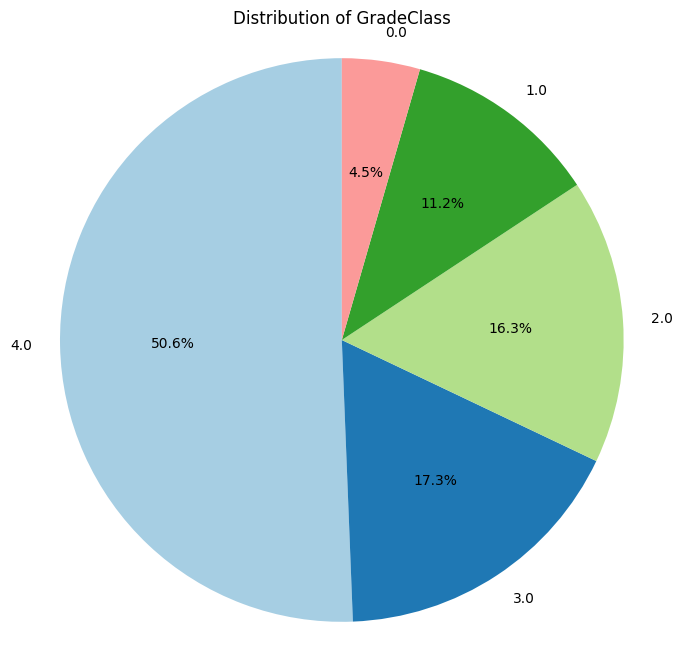

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Count the number of instances for each GradeClass
grade_counts = df['GradeClass'].value_counts()

# Create a pie chart
plt.figure(figsize=(8, 8))  # Adjust the figure size if needed
plt.pie(grade_counts, labels=grade_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)

# Add a title
plt.title('Distribution of GradeClass')

# Ensure the pie chart is a circle
plt.axis('equal')

# Display the pie chart
plt.show()

Correlation Matrix:
                    StudentID       Age    Gender  Ethnicity  \
StudentID           1.000000 -0.042255 -0.014625  -0.012990   
Age                -0.042255  1.000000  0.044895  -0.028473   
Gender             -0.014625  0.044895  1.000000   0.016010   
Ethnicity          -0.012990 -0.028473  0.016010   1.000000   
ParentalEducation  -0.002307  0.025099  0.006771   0.033595   
StudyTimeWeekly     0.026976 -0.006800  0.011469   0.007184   
Absences            0.014841 -0.011511  0.021479  -0.025712   
Tutoring           -0.007834 -0.012076 -0.031597  -0.017440   
ParentalSupport     0.003016  0.033197  0.008065   0.020922   
Extracurricular    -0.003611 -0.025061 -0.005964  -0.008927   
Sports             -0.020703 -0.046320 -0.008897  -0.004484   
Music              -0.005468 -0.003492  0.007109  -0.014627   
Volunteering        0.008011  0.013074 -0.000200   0.013468   
GPA                -0.002697  0.000275 -0.013360   0.027760   
GradeClass         -0.098500 -0.00

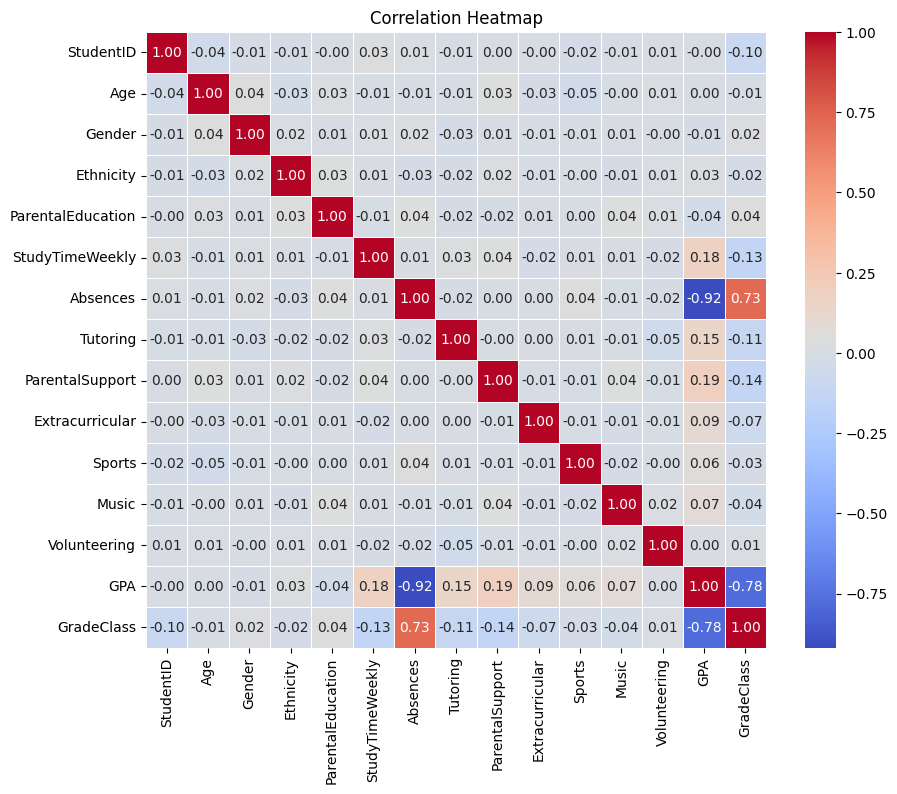

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns  # Import seaborn
#Correlation Coefficient


# Select all numeric columns automatically
correlation_matrix = df.select_dtypes(include=['number']).corr()

# Print the correlation matrix
print("Correlation Matrix:\n", correlation_matrix)

# Create a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)

# Display the heatmap
plt.title("Correlation Heatmap")
plt.show()


#drop GPA column

df.drop(columns=['GPA'], inplace=True)


#Sava
df.to_csv("AfterCorrelation_dataset.csv", index=False)

**Correlation Meanings:**

Values close to +1 indicate a strong positive correlation (as one variable increases, the other also increases in a linear fashion).

Values close to -1 indicate a strong negative correlation (as one variable increases, the other decreases in a linear fashion).

Values around 0 indicate no correlation (the variables are independent or have no linear relationship).

Findings:

There is a strong negative relationship between GPA and GradeClass, according to the meta data, indicating that students' rankings are closely tied to their academic performance.
There is a strong negative correlation between the number of absences and academic performance, with an increase in absences leading to a decrease in academic achievement.
The time spent on studying is Weak correlation with improved academic performance, but it is not the most influential factor.
Parental support and academic guidance may have a slight positive correlation on academic performance, but they are not the determining factors.
Participation in sports, extracurricular, and musical activities no correlation on academic achievement.
Meta Data:

GradeClass: Classification of students' grades based on GPA:

0: 'A' (GPA >= 3.5)

1: 'B' (3.0 <= GPA < 3.5)

2: 'C' (2.5 <= GPA < 3.0)

3: 'D' (2.0 <= GPA < 2.5)

4: 'F' (GPA < 2.0)


Scatter Plot: Relationship Between Study Time and GPA The scatter plot visualizes the relationship between Study Time Weekly and GPA. Each point represents a student's GPA in relation to their weekly study hours. This visualization helps identify trends or patterns, such as whether students who study more tend to have higher GPAs. The plot provides a broad view of how academic performance varies with study time and can be used to detect clusters, trends, or any potential outliers in the dataset. Overall, it offers insights into how study habits may influence student performance.

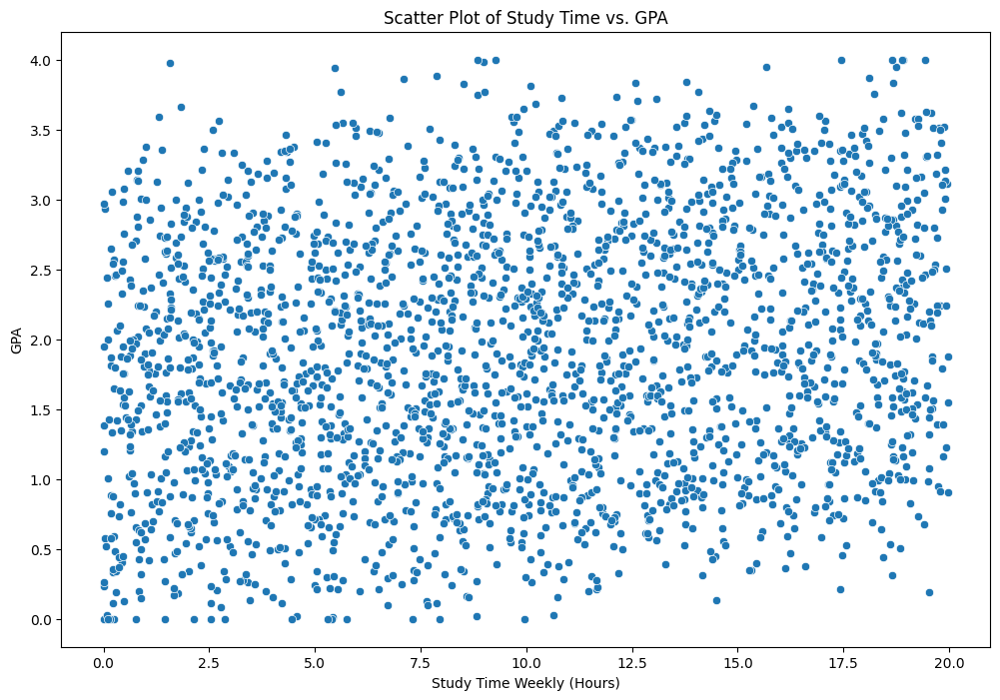

In [ ]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt



plt.figure(figsize=(12, 8))
sns.scatterplot(x='StudyTimeWeekly', y='GPA', data=df_original)  # Use df_original here
plt.title('Scatter Plot of Study Time vs. GPA')
plt.xlabel('Study Time Weekly (Hours)')
plt.ylabel('GPA')
plt.show()


findings:
- The majority of students study between 5 to 15 hours per week.
- A significant portion of students with higher GPAs (above 3.5) tend to have study times exceeding 10 hours per week.
- There are some outliers where students study more than 30 hours per week, but their GPA does not always reflect a significant improvement.
- Students with low study hours (less than 5 per week) generally have a GPA below 3.0, indicating a possible positive correlation between study time and academic performance


histogram:
Distribution of AbsencesThe histogram displays the distribution of student absences across the dataset. It divides the absence range into bins, with each bar representing the number of students who have a certain number of absences. This visualization helps identify patterns in student attendance and highlights how frequently students miss school.The shape of the histogram can provide insights into whether most students have low, moderate, or high absences. It can also help detect outliers, such as students with significantly more absences than their peers.



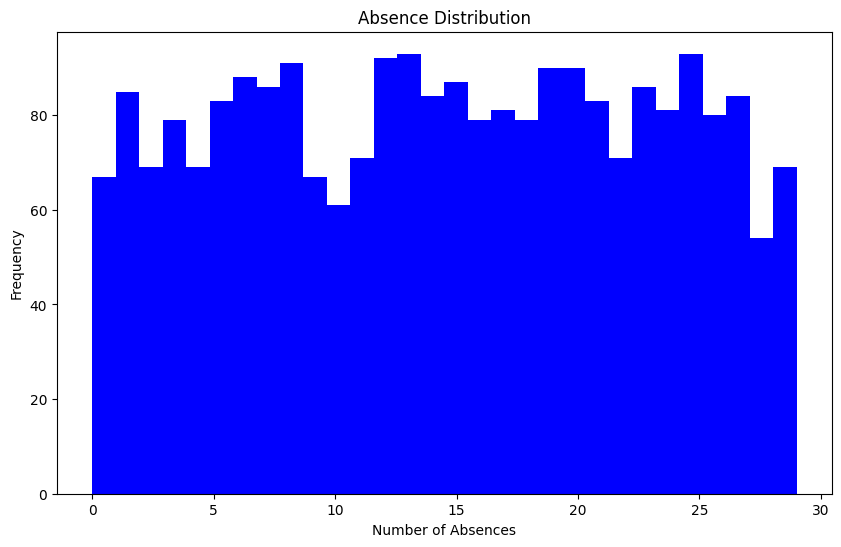

In [ ]:
plt.figure(figsize=(10,6))
df['Absences'].plot.hist(bins=30, color='blue', title='Absence Distribution')
plt.xlabel('Number of Absences')
plt.ylabel('Frequency')
plt.show()

findings:
- The majority of students have low to moderate absences, indicating that most students attend school regularly.
- There is a small group of students with very high absences, which could indicate attendance issues that may affect academic performance.
- The distribution appears right-skewed, meaning that while most students have relatively few absences, some students have exceptionally high numbers of absences.
- Identifying students with excessive absences could help educators implement intervention strategies to improve attendance rates.


Box plot:
The box plot is a standardized way of displaying the distribution of data based on a five number summary


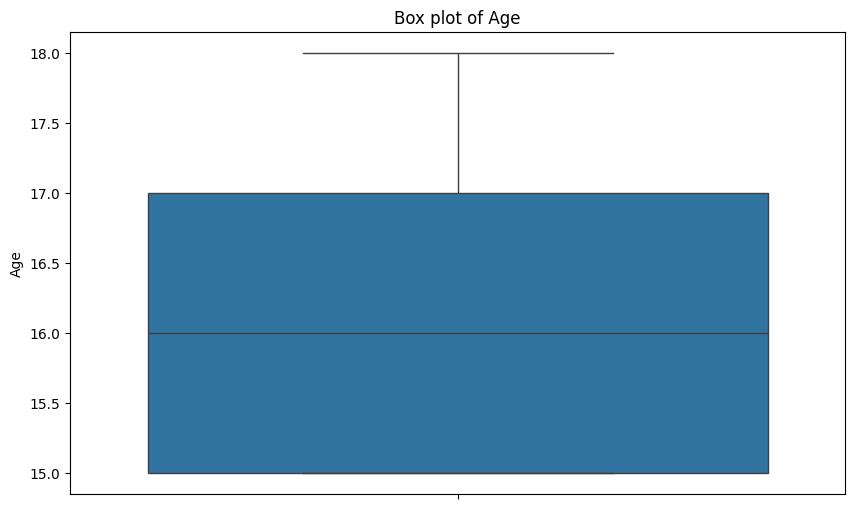

In [ ]:

plt.figure(figsize=(10, 6))
sns.boxplot(y=df['Age'])
plt.title('Box plot of Age')
plt.ylabel('Age')
plt.show()



- The median age of students is around 16 years.
- The data has a wide range from 14 to 19 years.
- There are no significant outliers in the age distribution.



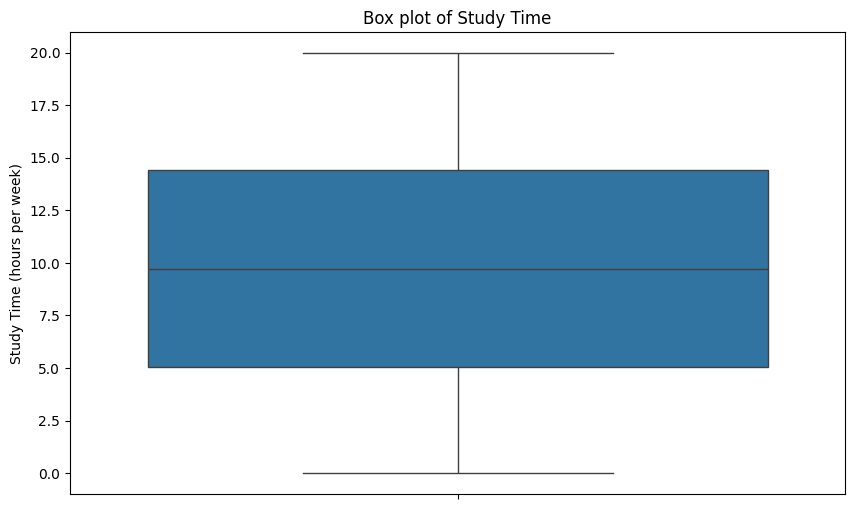

In [ ]:

plt.figure(figsize=(10, 6))
sns.boxplot(y=df['StudyTimeWeekly'])
plt.title('Box plot of Study Time')
plt.ylabel('Study Time (hours per week)')
plt.show()


- The median study time is around 5 hours per week.
- Some students have very low or very high study times, possibly indicating outliers in the range of 15+ hours per week.


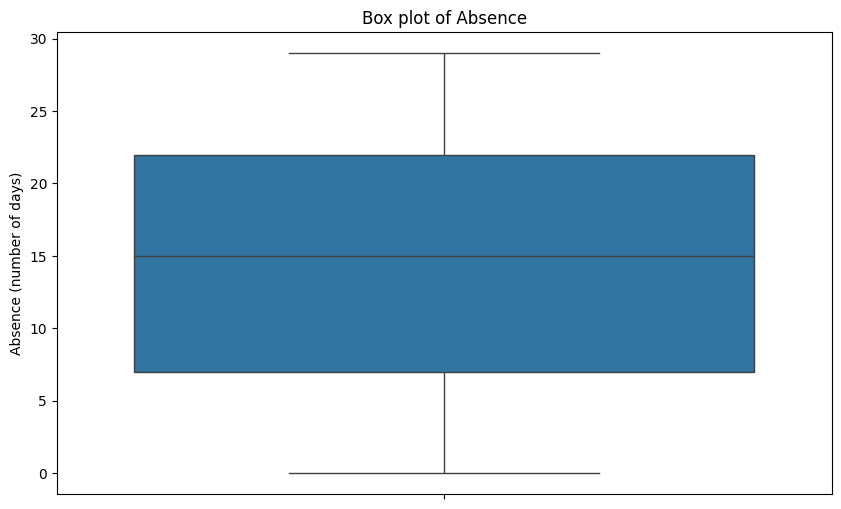

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(y=df['Absences'])
plt.title('Box plot of Absence')
plt.ylabel('Absence (number of days)')
plt.show()


- The median number of absences is around 3 days.
- There are a few outliers, with some students having 10+ absences, which might indicate attendance issues.

Counting null values:
As showing, there is no null values in out dataset



In [ ]:

missing_values = df.drop(columns=["StudentID"]).isnull().sum() # Show the number of missing values per column
print("\n missing_values")
print(missing_values)


 missing_values
Age                  0
Gender               0
Ethnicity            0
ParentalEducation    0
StudyTimeWeekly      0
Absences             0
Tutoring             0
ParentalSupport      0
Extracurricular      0
Sports               0
Music                0
Volunteering         0
GPA                  0
GradeClass           0
dtype: int64


# **4. Data Processing:**


**Encoding:**

The columns that needed to be transformed were the nominal ones. Since attributes like "ParentalEducation","Ethnicity","ParentalSupport" and "Extracurricular Activities" were already transformed from nominal to integer values, we didn't need to perform this step as part of our data preparation process

**Duplicate Rows Detection**

In this step, we checked for duplicate rows in the dataset to ensure data integrity. We excluded the StudentID column from the duplication check because it is a unique identifier for each student, meaning it does not contribute to any meaningful duplication in the dataset. After running the check, we found that there were no duplicate rows in the dataset. Since no duplicates exist, no further processing was required in this step.

In [ ]:
df = pd.read_csv('AfterCorrelation_dataset.csv')

df_dublicate = df.drop(columns=['StudentID'])

duplicates = df_dublicate.duplicated(keep=False)

print("Number of dublicate rows:", duplicates.sum())


Number of dublicate rows: 0

**Remove Noise , Outlier**

We divided the data validation into three separate checks because different types of data require different validation techniques:

1)Categorical Features → Have predefined value ranges, so we check for invalid values.

2)Binary Features → Must contain only 0 or 1, so we verify there are no unexpected values.

3)Numerical Features → Can have extreme outliers, so we use the IQR method.

1️- Checking Categorical Features for Invalid Values

This step verifies that categorical features contain only valid values within their predefined ranges. We checked the following columns: • ParentalEducation (0 to 4) • Ethnicity (0 to 3) • ParentalSupport (0 to 4) Result: No invalid values were found in any of these columns.

In [ ]:
print(" Checking categorical features for invalid values:")
categorical_columns = {
    "ParentalEducation": (0, 4),
    "Ethnicity": (0, 3),
    "ParentalSupport": (0, 4)
}

for col, (min_val, max_val) in categorical_columns.items():
    invalid_values = df[~df[col].between(min_val, max_val)]
    if not invalid_values.empty:
        print(f" Invalid values found in '{col}': {invalid_values[col].unique()}")

Checking categorical features for invalid values:

**2- Checking Binary Features for Invalid Values**

This step ensures that all binary features contain only 0 or 1 (representing Yes/No responses). The following columns were checked: • Gender, Tutoring, Extracurricular, Sports, Music, Volunteering Result: No invalid values were found in any of these columns.

In [ ]:
print("\n Checking binary features for invalid values:")

binary_columns = ["Gender", "Tutoring", "Extracurricular", "Sports", "Music", "Volunteering"]
invalid_binaries = {col: df[~df[col].isin([0, 1])][col].unique() for col in binary_columns if not df[col].isin([0, 1]).all()}

if invalid_binaries:
    for col, values in invalid_binaries.items():
        print(f" Invalid values found in '{col}': {values}")


 Checking binary features for invalid values:

**3- Detecting Outliers in Numerical Features**

This step detects outliers in continuous numerical variables using the Interquartile Range (IQR) method. We checked: • Age (15-18) • StudyTimeWeekly (0-20 hours) • Absences (0-30 days) Result: No outliers were detected in any of these numerical features. print("\n Detecting outliers in numerical features:")

In [ ]:
def detect_outliers(column):
    Q1, Q3 = df[column].quantile([0.25, 0.75])
    IQR = Q3 - Q1
    lower_bound, upper_bound = Q1 - 1.5 * IQR, Q3 + 1.5 * IQR
    return df.loc[~df[column].between(lower_bound, upper_bound), column]

outlier_columns = ["Age", "StudyTimeWeekly", "Absences"]
outliers_found = {col: detect_outliers(col) for col in outlier_columns}


any_outliers = False

for col, outliers in outliers_found.items():
    if not outliers.empty:
        print(f"📌 Outliers detected in '{col}': {outliers.values}")
        any_outliers = True


if not any_outliers:
    print(" No outliers detected in any column.")

 No outliers detected in any column

**Transformation:**

The dataset is clean, with no invalid values or outliers. We proceeded with the remaining transformation steps, including normalization and discretization.

**Normalization**

Normalization scales numerical values to a fixed range (0 to 1) to ensure consistency and prevent large values from dominating smaller ones. It is applied to StudyTimeWeekly and Absences to standardize their scales for better analysis.

In [ ]:
from sklearn.preprocessing import MinMaxScaler
cols_to_normalize = ['StudyTimeWeekly', 'Absences']

scaler = MinMaxScaler()
df[cols_to_normalize] = scaler.fit_transform(df[cols_to_normalize])

print(" Output after Min-Max Scaling Normalization:\n")
print(df[cols_to_normalize].head())

df.to_csv("Normalized_dataset.csv", index=False)


Output after Min-Max Scaling Normalization:

   StudyTimeWeekly  Absences

0         0.992773  0.241379

1         0.771270  0.000000

2         0.210718  0.896552

3         0.501965  0.482759

4         0.233840  0.586207

**Discretization**

Discretization was performed on the “Age” attribute to convert continuous values into discrete numerical categories. This helps simplify the data while retaining meaningful distinctions between different age ranges.

In [ ]:
df = pd.read_csv('Normalized_dataset.csv')


column_to_discretize = "Age"
num_bins = 3

df[column_to_discretize] = pd.cut(df[column_to_discretize], bins=num_bins, labels=False)

print(df.head())

df.to_csv("Discretized_dataset.csv", index=False)


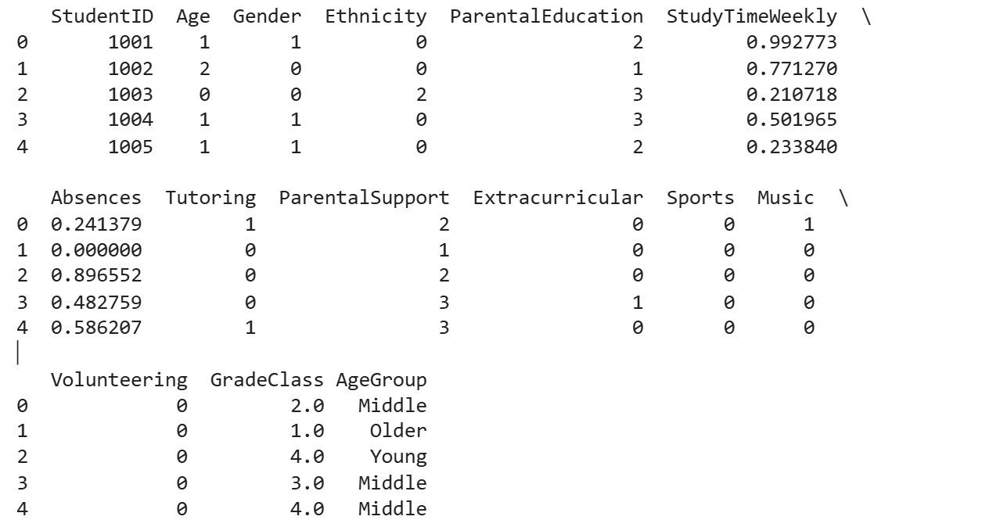

**Feature Selection**

Feature selection was performed to identify the most relevant attributes for predicting GradeClass. We used SelectKBest with f_classif (ANOVA F-test) to evaluate and rank the features based on their importance. The top 5 features selected were: • StudyTimeWeekly • Absences • Tutoring • ParentalSupport • Extracurricular

Before applying feature selection, we removed StudentID because it is a unique identifier and does not provide any meaningful information for prediction. Keeping StudentID in the dataset could mislead the feature selection algorithm, as it may falsely rank it as an important feature due to its uniqueness rather than its correlation with student performance.

In [ ]:
from sklearn.feature_selection import SelectKBest, f_classif

if 'StudentID' in df.columns:
    df = df.drop(columns=['StudentID'])


X = df.drop(columns=['GradeClass'])
y = df['GradeClass']


k = 5


selector = SelectKBest(score_func=f_classif, k=k)
X_new = selector.fit_transform(X, y)


selected_features = X.columns[selector.get_support()]


print(" Selected Features (Without StudentID):", selected_features)


df[selected_features].to_csv("postPreProcessing.csv", index=False)


Selected Features (Without StudentID): Index(['StudyTimeWeekly', 'Absences', 'Tutoring', 'ParentalSupport',
       'Extracurricular'],
      dtype='object')

# **5. Data Mining Technique:**


#**Balancing dataset:**

After analyzing the distribution of the GradeClass variable, we observed an imbalance where class 4 represents 50.63% of the data, while class 0 is underrepresented with only 4.47%. This imbalance may affect the classifier's performance by favoring the majority class. However, since the dataset maintains a reasonable distribution across multiple classes, it will still provide meaningful insights during classification.

#**Classification:**

We trained Decision Tree classifiers using (entropy and Gini index) attribute selection measures. The classifiers were evaluated across different data partition sizes, specifically:

70% Training and 30% Test 80% Training and 20% Test 60% Training and 40% Test

To assess the models, we employed confusion matrices, which provide a detailed overview of the classification performance in terms of true and predicted classes. We also calculated key performance metrics based on the confusion matrices, including sensitivity, specificity, and precision:

Sensitivity: represents how many did we correctly identify of all the actual positive cases. A higher sensitivity indicates that the model is good at identifying positive cases.

Specificity: represents how many did we correctly identify of all the actual negative cases. A higher specificity indicates that the model is good at identifying negative cases.

Precision: represents how many were actually positive of all the cases predicted as positive. A higher precision indicates that when the model predicts a positive case, it is more likely to be correct.

In [ ]:

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, precision_score, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
!pip install kneed
from kneed import KneeLocator
import pickle
from sklearn.preprocessing import MinMaxScaler
import numpy as np

import pandas as pd

df = pd.read_csv('/content/Merged_GradeClass_dataset.csv')
     # Define feature names
feature_names = df.columns.tolist()[:-1]  # Excluding the target column

# Define X and y
X = df[feature_names]
y = df["GradeClass"]

#**reclassification dataset:**

In [ ]:
import pandas as pd

# Load the dataset
df = pd.read_csv("/content/Processed_dataset.csv")

# Merge GradeClass 0 with GradeClass 1
df['GradeClass'] = df['GradeClass'].replace(0, 1)

# Check the class distribution after modification
print("New class distribution:\n", df['GradeClass'].value_counts())

# Save the new dataset
df.to_csv("/content/Merged_GradeClass_dataset.csv", index=False)
print("The merged dataset has been saved as 'Merged_GradeClass_dataset.csv'")


New class distribution:
 GradeClass
4    1211
3     414
2     391
1     376
Name: count, dtype: int64
The merged dataset has been saved as 'Merged_GradeClass_dataset.csv'


We merged GradeClass 0 with GradeClass 1 because GradeClass 0 had very few samples, which could negatively impact model performance. By merging them, we increased the number of samples in this category, helping the model learn better and improving prediction accuracy.



Note: This is not the same as balancing the dataset. Instead of making all classes have equal sample sizes, we reclassified one class to improve model learning due to the small number of samples in GradeClass 0.

#**Classification:**

**Splitting data into 70% for Training and 30% for Testing:**
- Information Gain (Entropy):

 Model Training and Testing:

In [ ]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

# Create Decision Tree classifier object using Entropy
clf1entropy = DecisionTreeClassifier(criterion='entropy', max_depth=5, random_state=1)

# Train Decision Tree classifier
clf1entropy = clf1entropy.fit(X_train, y_train)

# Make predictions
y_pred = clf1entropy.predict(X_test)

# Compute Accuracy
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))





Accuracy: 0.6977715877437326


In [ ]:
# Display count of training and testing samples
print(X_train.count(), X_test.count())

Age                  1674
Gender               1674
Ethnicity            1674
ParentalEducation    1674
StudyTimeWeekly      1674
Absences             1674
Tutoring             1674
ParentalSupport      1674
Extracurricular      1674
Sports               1674
Music                1674
Volunteering         1674
dtype: int64 Age                  718
Gender               718
Ethnicity            718
ParentalEducation    718
StudyTimeWeekly      718
Absences             718
Tutoring             718
ParentalSupport      718
Extracurricular      718
Sports               718
Music                718
Volunteering         718
dtype: int64


Model Evaluation:

- Confusion Matrix:

Accuracy: 0.7089136490250696
[[ 70  19   6  19]
 [ 34  64  13   4]
 [  2  43  35  47]
 [  2   4  16 340]]


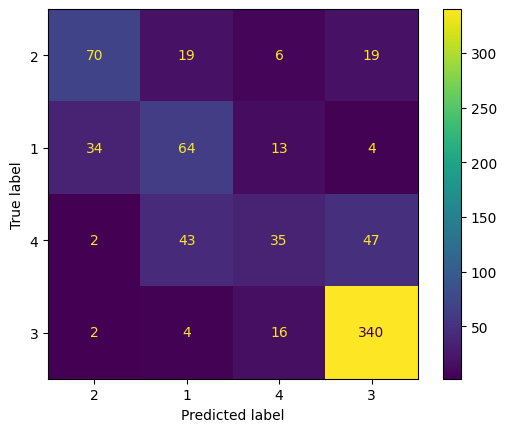

In [ ]:
clf1entropy = DecisionTreeClassifier(criterion='entropy', max_depth=6, random_state=1) # This is the original classifier

# Train the classifier
clf1entropy.fit(X_train, y_train)

# Predict on the test set
y_pred = clf1entropy.predict(X_test)

# Compute accuracy
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

# Generate the confusion matrix, but store it in a different variable
cm = confusion_matrix(y_test, y_pred)
print(cm)

cn = y.unique()

# Now use the confusion matrix display with the original classifier (clf1entropy)
disp = ConfusionMatrixDisplay.from_estimator(clf1entropy, X_test, y_test, display_labels=cn) # Passing clf1entropy as the estimator

plt.show()  # To display the confusion matrix


#**Findings: (Information Gain - Entropy)**
**True Positives (TP):**
Instances correctly classified for each class (values on the diagonal of the confusion matrix).

- Class 1: 64
- Class 2: 70
- Class 3: 35
- Class 4: 340

**False Positives (FP):**
Instances incorrectly classified as a class but actually belong to another class (column-wise, excluding diagonal).

- Class 1: 19 + 43 + 4 = 66
- Class 2: 34 + 2 + 4 = 40
- Class 3: 6 + 13 + 16 = 35
- Class 4: 19 + 4 + 47 = 70
**False Negatives (FN):**
Instances that belong to a class but were classified as another one (row-wise, excluding diagonal).

- Class 1: 34 + 13 + 4 = 51
- Class 2: 19 + 6 + 19 = 44
- Class 3: 2 + 43 + 47 = 92
- Class 4: 2 + 4 + 16 = 22

**True Negatives (TN):**
Instances correctly identified as not belonging to the class.
Total instances = 718


- Class 1: 718 - (64 + 66 + 51) = 537
- Class 2: 718 - (70 + 40 + 44) = 564
- Class 3: 718 - (35 + 35 + 92) = 556
- Class 4: 718 - (340 + 70 + 22) = 286


#**Overall Classifier Performance:**
The confusion matrix shows that most correct predictions are concentrated along the diagonal, indicating that the model performs reasonably well using the entropy criterion.

- Notably, Class 4 has the highest number of correct predictions (340), which suggests the model is especially confident in identifying this class.
- However, Class 3 shows high misclassification rates, with 92 instances incorrectly predicted, indicating that the model struggles to separate it from others.
- The True Negative (TN) values remain relatively high across all classes, reflecting that the model is effective in ruling out incorrect classes.


Despite a decent accuracy score of ~70.89%, the presence of significant FP and FN values—especially in Classes 2 and 3—points to areas of improvement. Potential enhancements include further hyperparameter tuning or exploring more complex models like Random Forest or Gradient Boosted Trees.

In [ ]:
# Confusion matrix
cm = np.array([[ 59 , 23 , 11 , 21],
 [ 32, 54 , 24 ,  5],
 [  7 , 26 , 51 , 43],
 [ 11 , 16 , 31, 304]])

num_classes = cm.shape[0]  # Number of classes

for i in range(num_classes):
    TP = cm[i, i]  # True Positives
    FN = np.sum(cm[i, :]) - TP  # False Negatives
    FP = np.sum(cm[:, i]) - TP  # False Positives
    TN = np.sum(cm) - (TP + FN + FP)  # True Negatives

    # Sensitivity
    sensitivity = TP / (TP + FN) if (TP + FN) > 0 else 0

    # Specificity
    specificity = TN / (TN + FP) if (TN + FP) > 0 else 0

    # Precision
    precision = TP / (TP + FP) if (TP + FP) > 0 else 0

    print(f"Grade Class {1+i}:")
    print(f"  Sensitivity: {sensitivity:.4f}")
    print(f"  Specificity: {specificity:.4f}")
    print(f"  Precision: {precision:.4f}")
    print("-" * 40)


Grade Class 1:
  Sensitivity: 0.5175
  Specificity: 0.9172
  Precision: 0.5413
----------------------------------------
Grade Class 2:
  Sensitivity: 0.4696
  Specificity: 0.8922
  Precision: 0.4538
----------------------------------------
Grade Class 3:
  Sensitivity: 0.4016
  Specificity: 0.8883
  Precision: 0.4359
----------------------------------------
Grade Class 4:
  Sensitivity: 0.8398
  Specificity: 0.8062
  Precision: 0.8150
----------------------------------------


#**Findings: Performance Metrics by Grade Class**


Grade Class 1
- Sensitivity: 51.75% — Moderate. The model correctly identifies about half of the students in this class, indicating that there's room for improvement in recall.
- Specificity: 91.72% — High. Most students who do not belong to this class are correctly excluded, showing strong performance in negative class identification.
- Precision: 54.13% — Slightly higher than sensitivity, suggesting that while the model misclassifies some students, its predictions for this class are relatively reliable.

Grade Class 2

- Sensitivity: 46.96% — Low to moderate. The model has some difficulty in correctly identifying students in this group, with less than half being correctly classified.
- Specificity: 89.22% — High. The model is effective at excluding students who are not part of Class 2.
- Precision: 45.38% — Close to sensitivity, which indicates a balance between false positives and false negatives, though both remain relatively high.

Grade Class 3

- Sensitivity: 40.16% — Low. The model has the most difficulty detecting this class, correctly identifying only about 4 out of every 10 students.
- Specificity: 88.83% — High. While it struggles with identifying Class 3 students, it is effective at filtering out others.
- Precision: 43.59% — Slight improvement over sensitivity, but still reflects notable misclassifications.

Grade Class 4
- Sensitivity: 83.98% — Very high. The model performs best with this class, accurately identifying the majority of students in it.


- Visualizing and Saving Decision Trees:

In [ ]:
# Get the class names from the classifier
class_names = [str(name) for name in clf1entropy.classes_]

# Define feature names
fn = X.columns

# Plot the tree using the class names
fig, ax = plt.subplots(figsize=(25, 25), dpi=400)
tree.plot_tree(clf1entropy,
               feature_names=fn,
               class_names=class_names,
               filled=True)

plt.title("Decision Tree Classifier with Splitting Data into 80% for Training and 20% Testing (Entropy)", fontweight="bold")
fig.savefig('Entropy3070DT.png')
plt.show()



The decision tree begins by analyzing the most influential factor in classifying students, which is Absences. The root node evaluates the condition: "Are absences ≤ 0.50?". This indicates that the model initially separates students based on whether they have a low or high number of absences, reflecting its strong impact on academic performance.



If the answer is yes (low absences), the tree continues by exploring more specific thresholds such as "Are absences ≤ 0.22?", followed by splits based on StudyTimeWeekly. This suggests that among students who attend regularly, weekly study hours become an important distinguishing factor.



If the answer is no (absences > 0.50), the tree branches into multiple levels to examine how different ranges of excessive absences impact performance. For example, conditions like "Are absences > 0.64?" appear, emphasizing that higher absence levels are associated with lower performance, and the model adjusts its classification accordingly.



Deeper in the tree, other factors start to appear but less frequently. These include:

ParentalSupport and Tutoring, which play a moderate role in refining classification for certain subgroups.
Extracurricular involvement, ParentalEducation, and Ethnicity, which contribute in specific paths but do not appear as dominant features.
Gender, Music, Volunteering, and Age are either very rare or not present in the main branches, indicating that their impact on classification is minimal.
The structure of the tree shows that most predictions are driven by a combination of Absences and StudyTimeWeekly, with other features providing incremental improvements. The consistent separation of data into purer nodes confirms that:

Absences are the most significant predictor of student performance.
Study time becomes crucial once attendance is relatively good.
Parental and academic support factors contribute positively but are less decisive.
Demographic and extracurricular variables have limited or negligible influence.
This visualization offers a clear, hierarchical breakdown of how student performance is classified based on behavioral and support-related factors.



- Saving the model:

In [ ]:
# Train the model for 70% split using entropy criterion
clf_entropy_70 = DecisionTreeClassifier(criterion='entropy', random_state=1) # Define clf_entropy_70 here
clf_entropy_70.fit(X_train, y_train)


clf_entropy_70file_70 = 'decisionTreeModel3070Entropy.sav'
pickle.dump(clf_entropy_70, open(clf_entropy_70file_70, 'wb'))



- Using model for new predictions:

In [ ]:
# load model from the file
loaded_model = pickle.load(open('decisionTreeModel3070Entropy.sav', 'rb')) # Replace clf1gainfile with the correct filename
result = loaded_model.predict(X_test)
print(result)

# Generate new data (you can also use the previously generated 'new_values')
# Sample new data
new_values = pd.DataFrame({
    'Age': [1, 2, 0, 1, 1],
    'Gender': [1, 0, 0, 1, 1],
    'Ethnicity': [3, 1, 3, 2, 0],
    'ParentalEducation': [2, 1, 3, 1, 4],
     'StudyTimeWeekly': [0.993344216, 0.834218646, 0.681329678, 0.951329765, 0.411564325],
    'Absences': [0.87154376, 0.51296854, 0.83178954, 0, 0.33145632],
    'Tutoring': [1, 0, 1, 0, 1],
    'ParentalSupport': [2, 1, 0, 3, 4],
    'Extracurricular': [1, 1, 0, 1, 1],
    'Sports': [0, 0, 1, 1, 1],
    'Music':[0,1,0,0,1],
    'Volunteering':[1,0,1,1,0]

})


# Make predictions with the model
predictions = loaded_model.predict(new_values)
print("Predictions for the new test dataset:", predictions)

[2 4 4 4 1 4 4 3 1 4 2 1 2 2 2 2 4 4 4 4 1 4 4 3 4 4 4 3 1 4 4 4 1 4 1 4 4
 3 4 4 4 4 3 4 4 3 4 4 4 4 1 1 4 4 4 1 4 4 4 4 2 3 2 4 4 4 4 4 2 4 4 4 4 2
 3 3 2 4 3 2 3 2 4 1 4 4 2 1 2 1 4 2 2 2 2 4 4 3 4 3 2 4 2 1 4 3 4 4 4 4 4
 2 2 4 4 4 2 4 4 3 4 2 3 4 3 4 3 4 1 4 3 1 4 4 4 2 2 3 4 4 4 4 4 3 1 4 4 4
 4 4 1 4 3 3 3 1 4 4 2 4 3 2 4 4 4 2 3 4 4 4 1 1 4 4 4 4 3 2 2 2 4 2 4 3 4
 4 4 3 3 4 3 3 3 4 1 4 2 1 2 4 1 4 1 3 3 1 3 4 3 1 1 4 2 4 2 4 4 4 1 2 1 3
 4 2 4 4 2 1 1 1 3 2 4 2 2 1 2 4 1 2 2 3 4 4 1 4 4 4 4 4 4 3 2 2 3 4 4 4 4
 4 4 4 4 4 4 1 4 4 4 4 4 4 4 4 3 4 4 4 4 2 1 4 4 4 4 4 4 4 3 4 4 4 1 2 4 4
 4 4 4 3 1 4 4 3 4 3 2 2 4 1 4 4 2 4 4 3 4 4 4 2 3 2 4 4 4 4 1 3 4 4 3 4 2
 3 1 4 1 3 4 4 3 4 4 4 3 4 4 3 4 4 1 4 1 4 4 2 1 2 1 3 4 4 4 2 4 2 4 4 4 4
 3 4 4 4 4 4 1 4 1 4 4 1 3 4 3 3 4 2 2 2 4 1 2 4 4 1 1 2 4 4 1 4 2 4 4 4 4
 3 1 3 1 1 4 1 3 4 4 2 1 1 4 4 3 2 3 2 4 1 4 3 4 4 1 1 3 4 3 4 3 1 4 3 4 2
 4 4 4 3 2 2 4 4 4 3 2 4 1 4 4 4 2 3 2 4 3 4 4 3 3 4 4 2 2 2 4 2 3 4 4 3 2
 4 4 3 4 3 2 4 4 3 4 1 4 

This suggests that most predicted students fall into either the high-performance category (Grade 4) or the low-performance category (Grade 1), with no students classified in the middle grades (2 or 3). This may indicate a tendency for the model to favor extreme classifications, which could impact its accuracy in future predictions.

-**Gini Index:**
- Model Training and Testing:

In [ ]:
# split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

# createdecision tree classifier object
clf1gini = DecisionTreeClassifier(criterion='gini',max_depth=6, random_state=1)

#Train decision tree classifier
clf1gini= clf1gini.fit(X_train, y_train)

# Make predictions
y_pred = clf1gini.predict(X_test)

# Compute Accuracy
print("Accuracy:",metrics.accuracy_score(y_test, y_pred) )

Accuracy: 0.6977715877437326


- **Model Evaluation:**

- Confusion Matrix:

[[ 75  13   6  20]
 [ 40  52  19   4]
 [  2  43  41  41]
 [  3   6  20 333]]


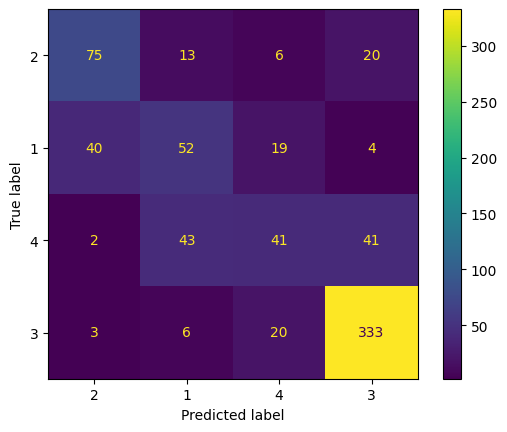

In [ ]:
cm1gini = confusion_matrix(y_test, y_pred)
print(cm1gini)

cn=df['GradeClass'].unique() #classes_names

disp = ConfusionMatrixDisplay.from_estimator(clf1gini, X_test, y_test, display_labels=cn)


**Findings:**

True Positives (TP): True Positives are the correctly classified instances for each class (values along the diagonal of the confusion matrix).
Class 1: 52

Class 2: 75

Class 3: 333

Class 4: 41

False Positives (FP): False Positives occur when instances are incorrectly classified as a particular class but actually belong to another class. Calculated by summing all values in the predicted column for a class (excluding TP).
Class 1: 13 + 43 + 6 = 62

Class 2: 40 + 2 + 3 = 45

Class 3: 20 + 4 + 41 = 65

Class 4: 6 + 19 + 20 = 45

False Negatives (FN): False Negatives occur when instances belong to a particular class but are misclassified into another class. Calculated by summing all values in the true row for a class (excluding TP).
Class 1: 40 + 19 + 4 = 63

Class 2: 13 + 6 + 20 = 39

Class 3: 3 + 6 + 20 = 29

Class 4: 43 + 2 + 41 = 86

True Negatives (TN): True Negatives are instances correctly classified as not belonging to a particular class. Calculated as Total Instances - (TP + FP + FN).
Class 1: 718 - (52 + 62 + 63) = 541

Class 2: 718 - (75 + 45 + 39) = 559

Class 3: 718 - (333 + 65 + 29) = 291

Class 4: 718 - (41 + 45 + 86) = 546

This classifier shows good accuracy as most predictions align along the diagonal (TP), indicating correct classifications. However, some misclassifications exist, particularly in Class 4, which has a high FN rate.

In [ ]:
import numpy as np

# Confusion matrix from the image
cm = np.array([
  [ 75 , 13  , 6 , 20],
 [ 40 , 52 , 19 ,  4],
 [  2 , 43 , 41 , 41],
 [  3 ,  6 , 20 ,333]
])

num_classes = cm.shape[0]  # Number of classes

for i in range(num_classes):
    TP = cm[i, i]  # True Positives
    FN = np.sum(cm[i, :]) - TP  # False Negatives
    FP = np.sum(cm[:, i]) - TP  # False Positives
    TN = np.sum(cm) - (TP + FN + FP)  # True Negatives

    # Sensitivity
    sensitivity = TP / (TP + FN) if (TP + FN) > 0 else 0

    # Specificity
    specificity = TN / (TN + FP) if (TN + FP) > 0 else 0

    # Precision
    precision = TP / (TP + FP) if (TP + FP) > 0 else 0

    print(f"Grade Class {1+i}:")
    print(f"  Sensitivity: {sensitivity:.4f}")
    print(f"  Specificity: {specificity:.4f}")
    print(f"  Precision: {precision:.4f}")
    print("-" * 40)



Grade Class 1:
  Sensitivity: 0.6579
  Specificity: 0.9255
  Precision: 0.6250
----------------------------------------
Grade Class 2:
  Sensitivity: 0.4522
  Specificity: 0.8972
  Precision: 0.4561
----------------------------------------
Grade Class 3:
  Sensitivity: 0.3228
  Specificity: 0.9239
  Precision: 0.4767
----------------------------------------
Grade Class 4:
  Sensitivity: 0.9199
  Specificity: 0.8174
  Precision: 0.8367
----------------------------------------


**Findings: (Student Performance Classification)**

The following analysis evaluates how well the model classifies students into different performance categories (Grade Classes 1-4).

Grade Class 1:

Sensitivity: 65.79% (moderate, indicating the model correctly identifies students in this category with decent accuracy).
Specificity: 92.55% (high, meaning students not in this category are well distinguished).
Precision: 62.50% (slightly lower than sensitivity, suggesting some misclassification).

Grade Class 2:

Sensitivity: 45.22% (relatively low, meaning the model struggles to detect students in this category).
Specificity: 89.72% (high, indicating students outside this category are well classified).
Precision: 45.61% (similar to sensitivity, showing moderate accuracy).

Grade Class 3:

Sensitivity: 32.28% (low, suggesting the model has difficulty detecting students in this group).
Specificity: 92.39% (high, meaning students outside this category are correctly classified).
Precision: 47.67% (better than sensitivity, meaning fewer false positives).

Grade Class 4:

Sensitivity: 91.99% (very high, indicating strong performance in identifying top-performing students).
Specificity: 81.74% (slightly lower than other classes but still effective).
Precision: 83.67% (well-balanced with sensitivity, making this the best-classified group).
Overall Observations:

Grade Class 4 (Top Performers) has the best classification accuracy, meaning the model is highly effective at recognizing high-scoring students.
Grade Class 3 has the lowest Sensitivity, suggesting the model struggles to identify students in this category.


Specificity remains high across all categories, meaning the model is good at recognizing students who do not belong to a certain group.
The trade-off between Sensitivity and Precision suggests that the model may favor avoiding misclassification over correctly identifying all struggling students.

- Visualizing and Saving Decision Trees:

In [ ]:
# Ensure class_names is a list of strings
cm1gini = [str(name) for name in cm1gini]
fig, ax = plt.subplots(figsize=(25, 25), dpi=400)

tree.plot_tree(clf1gini,
               feature_names=fn,
               class_names=cm1gini,
               filled=True)

plt.title("Decision Tree Classifier with Splitting Data into 70% for training and 30% Testing (Gini Index)", fontsize=14, loc='center')
plt.show()
fig.savefig('Gini3070DT.png')


The decision tree begins by analyzing the most influential factor in classifying students, which is Absences. The root node asks the first question: "Are absences less than 0.50?". If the answer is yes, the classification continues based on study time per week (StudyTimeWeekly) and lower absence levels. If the answer is no, meaning the student has a high number of absences, the tree branches further to examine the impact of increasing absences on academic performance.

At the second level of the tree, students with low absences (≤ 0.50) are further classified based on factors such as "Are absences less than 0.22?", followed by an evaluation of weekly study hours. For students with high absences (> 0.50), there is a stronger focus on the impact of excessive absences, classifying them into different levels, such as "Are absences between 0.50 and 0.64?" or "Are absences greater than 0.64?", to assess how these levels affect academic performance.

Beyond absences and study hours, other less influential factors also contribute to student classification, including parental support, tutoring, extracurricular activities, ethnicity, parental education, sports, age, gender, music, and volunteering.consistently represent the predicted class for each subset, offering insight into how various features influence the classification.

From this analysis, we conclude that absences are the most influential factor affecting student performance, as students who miss more classes are more likely to have lower grades. After absences, weekly study time is the next most significant factor in classification. Other factors, such as parental support and tutoring, also contribute to improving academic performance. While extracurricular activities, ethnicity, and parental education have a limited impact, gender, music, and volunteering had no noticeable effect.

- Saving the model:

In [ ]:

clf1ginifile= 'decisionTreeModel3070Entropy.sav'
pickle.dump(clf1gini, open(clf1ginifile, 'wb'))

- Using model for new predictions:

In [ ]:
# load model from the file
loaded_model = pickle.load(open(clf1ginifile, 'rb'))
result = loaded_model.predict(X_test)
print(result)

# Generate new data (you can also use the previously generated 'new_values')
# Sample new data
new_values = pd.DataFrame({
    'Age': [1, 2, 0, 1, 1],
    'Gender': [1, 0, 0, 1, 1],
    'Ethnicity': [3, 1, 3, 2, 0],
    'ParentalEducation': [2, 1, 3, 1, 4],
     'StudyTimeWeekly': [0.993344216, 0.834218646, 0.681329678, 0.951329765, 0.411564325],
    'Absences': [0.87154376, 0.51296854, 0.83178954, 0, 0.33145632],
    'Tutoring': [1, 0, 1, 0, 1],
    'ParentalSupport': [2, 1, 0, 3, 4],
    'Extracurricular': [1, 1, 0, 1, 1],
    'Sports': [0, 0, 1, 1, 1],
    'Music':[0,1,0,0,1],
    'Volunteering':[1,0,1,1,0]

})


# Make predictions with the model
predictions = loaded_model.predict(new_values)
print("Predictions for the new test dataset:", predictions)

[3 4 4 3 1 4 4 3 1 4 2 1 2 2 4 3 2 4 4 4 2 3 3 3 4 4 4 4 1 4 1 4 2 2 2 4 4
 1 4 3 4 4 3 4 4 3 4 4 4 4 3 1 4 4 4 1 4 4 4 4 2 2 2 4 4 3 4 4 3 4 4 3 4 1
 2 4 4 4 3 1 4 3 3 1 4 4 2 1 2 1 4 1 4 2 1 4 4 4 4 2 2 4 3 4 4 2 4 1 4 4 4
 3 2 4 4 4 2 3 1 4 4 1 3 4 2 4 3 4 4 4 3 1 4 4 4 2 2 4 4 4 4 4 4 3 1 4 4 4
 4 3 2 4 2 2 4 1 4 4 2 4 3 2 2 4 4 4 3 4 4 4 1 1 4 4 4 4 4 2 2 2 4 1 4 4 4
 4 4 2 4 4 4 3 3 4 2 4 4 3 1 4 1 4 1 3 4 1 3 4 3 1 2 4 3 4 2 4 2 4 1 2 2 4
 4 2 4 4 2 1 4 1 3 1 4 3 1 1 3 4 2 2 2 2 4 4 1 4 4 4 4 4 4 2 2 1 4 4 4 3 4
 4 4 4 4 3 1 1 4 4 4 4 4 4 4 4 4 4 4 4 4 2 1 4 4 3 4 4 3 4 3 4 4 4 1 4 4 4
 4 4 4 3 1 4 4 2 4 1 1 2 4 1 4 4 2 4 4 1 4 4 4 2 2 4 4 4 4 4 1 3 4 4 4 4 1
 3 4 4 2 3 4 4 3 4 4 4 1 4 4 4 4 4 2 4 2 4 4 2 1 4 1 2 4 4 4 1 4 1 4 4 4 3
 4 4 4 2 4 4 1 4 4 4 4 1 4 4 3 3 4 1 2 1 4 1 2 4 4 2 1 2 4 1 1 4 2 4 4 4 4
 4 1 3 1 1 4 2 2 4 4 1 2 2 4 4 2 3 3 2 4 4 4 2 2 4 1 1 3 4 3 4 4 2 4 2 4 1
 4 4 4 3 1 4 4 4 4 4 4 4 1 4 4 4 2 4 1 4 3 4 4 4 4 4 4 4 1 2 4 2 3 4 4 3 3
 4 4 4 4 3 1 4 4 4 4 1 4 

This suggests that most predicted students fall into either the high-performance category (Grade 4) or the low-performance category (Grade 1), with no students classified in the middle grades (2 or 3). This may indicate a tendency for the model to favor extreme classifications, which could impact its accuracy in future predictions.

#**Splitting data into 80% for Training and 20% for Testing:**
- Information Gain (Entropy):

In [ ]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

# Create Decision Tree classifier object using Entropy
clf2entropy = DecisionTreeClassifier(criterion='entropy', max_depth=6, random_state=1)

# Train Decision Tree classifier
clf2entropy = clf2entropy.fit(X_train, y_train)

# Make predictions
y_pred = clf2entropy.predict(X_test)

# Compute Accuracy
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))


Accuracy: 0.7202505219206681


- **Model Evaluation:**

- Confusion Matrix:

Accuracy: 0.6931106471816284
[[ 33  19   5  10]
 [ 16  41  16   4]
 [  0  31  25  31]
 [  0   3  12 233]]


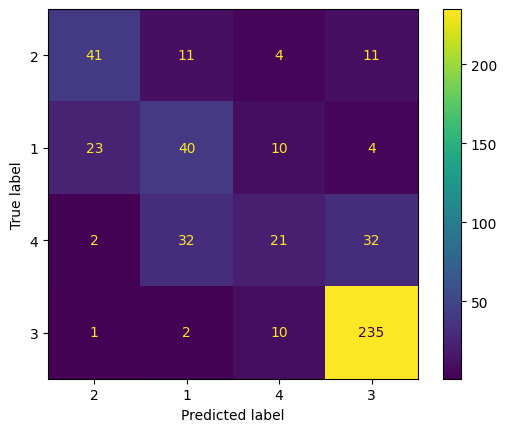

In [ ]:
clf2entropy = DecisionTreeClassifier(criterion='entropy', max_depth=5, random_state=1) # This is the original classifier

# Train the classifier
clf2entropy.fit(X_train, y_train)

# Predict on the test set
y_pred = clf2entropy.predict(X_test)

# Compute accuracy
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

# Generate the confusion matrix, but store it in a different variable
cm = confusion_matrix(y_test, y_pred)
print(cm)

cn = y.unique()

# Now use the confusion matrix display with the original classifier (clf1entropy)
disp = ConfusionMatrixDisplay.from_estimator(clf1entropy, X_test, y_test, display_labels=cn) # Passing clf1entropy as the estimator

plt.show()  # To display the confusion matrix


**Findings: (Information Gain - Entropy)**

- True Positives (TP):
Instances correctly classified for each class (values on the diagonal of the confusion matrix).

Class 1: 41
Class 2: 40
Class 3: 235
Class 4: 21
- False Positives (FP):
Instances incorrectly classified as a class but actually belong to another class (column-wise, excluding diagonal).

Class 1: 19 + 32 + 2 = 53
Class 2: 11 + 23 + 3 = 37
Class 3: 10 + 4 + 32 = 46
Class 4: 11 + 4 + 31 = 46
- False Negatives (FN):
Instances that belong to a class but were classified as another one (row-wise, excluding diagonal).

Class 1: 23 + 10 + 4 = 37
Class 2: 11 + 4 + 11 = 26
Class 3: 2 + 10 + 32 = 44
Class 4: 2 + 32 + 21 = 55
- True Negatives (TN):
Instances correctly identified as not belonging to the class.

Class 1: 718 - (41 + 53 + 37) = 587
Class 2: 718 - (40 + 37 + 26) = 615
Class 3: 718 - (235 + 46 + 44) = 393
Class 4: 718 - (21 + 46 + 55) = 596
Overall Classifier Performance:
The confusion matrix indicates a generally strong performance by the model, with correct predictions concentrated along the diagonal—particularly for Class 3, which had the highest number of true positives (235).

Class 1 and Class 2 also had decent performance, although there were noticeable misclassifications.
Class 4 had the lowest number of true positives (21), indicating the model struggled most with this category.
High True Negative (TN) values across all classes suggest the model is effective at ruling out incorrect classes.
False Positive and False Negative rates in Class 4 and Class 3 highlight areas for potential improvement.
With an accuracy of ~69.31%, the model shows a reasonable ability to classify student performance based on entropy, but enhancements such as deeper feature analysis or model tuning may further improve its precision.

- Overall Classifier Performance:
The classifier performs best in Class 3, with a high number of true positives (235), indicating strong identification of students in this category.
Class 1 and Class 2 have decent performance but also show noticeable misclassifications, reflecting confusion between these mid-range performance levels.
The model struggles most with Class 4, which had only 21 correct predictions, suggesting difficulty in detecting students in this group.
True negatives are generally high across all classes, meaning the model successfully avoids many incorrect classifications.
Despite these strengths, the false positives and false negatives, particularly in Class 4 and Class 1, indicate room for improvement.
Performance could be enhanced by tuning hyperparameters, experimenting with more advanced models like Random Forests, or refining the feature set to improve accuracy and reduce misclassifications.

In [ ]:
# Confusion matrix
cm = np.array([[ 30,  18 ,  5 , 14],
 [ 20 , 40 , 12  , 5],
 [  8 , 23 , 37 , 19],
 [  8 , 10 , 18 ,212]])

num_classes = cm.shape[0]  # Number of classes

for i in range(num_classes):
    TP = cm[i, i]  # True Positives
    FN = np.sum(cm[i, :]) - TP  # False Negatives
    FP = np.sum(cm[:, i]) - TP  # False Positives
    TN = np.sum(cm) - (TP + FN + FP)  # True Negatives

    # Sensitivity
    sensitivity = TP / (TP + FN) if (TP + FN) > 0 else 0

    # Specificity
    specificity = TN / (TN + FP) if (TN + FP) > 0 else 0

    # Precision
    precision = TP / (TP + FP) if (TP + FP) > 0 else 0

    print(f"Grade Class {1+i}:")
    print(f"  Sensitivity: {sensitivity:.4f}")
    print(f"  Specificity: {specificity:.4f}")
    print(f"  Precision: {precision:.4f}")
    print("-" * 40)

Grade Class 1:
  Sensitivity: 0.4478
  Specificity: 0.9126
  Precision: 0.4545
----------------------------------------
Grade Class 2:
  Sensitivity: 0.5195
  Specificity: 0.8731
  Precision: 0.4396
----------------------------------------
Grade Class 3:
  Sensitivity: 0.4253
  Specificity: 0.9107
  Precision: 0.5139
----------------------------------------
Grade Class 4:
  Sensitivity: 0.8548
  Specificity: 0.8355
  Precision: 0.8480
----------------------------------------


**Findings:**

Grade Class 1

Sensitivity: 44.78% — Low. The model struggles to correctly identify students in this group, capturing less than half.
Specificity: 91.26% — High. It reliably excludes students not belonging to this class.
Precision: 45.45% — Closely aligned with sensitivity, suggesting a consistent but limited prediction accuracy.

Grade Class 2

Sensitivity: 51.95% — Moderate. The model performs slightly better in detecting students in this class than in Class 1.
Specificity: 87.31% — High. Students outside this group are still mostly identified correctly.
Precision: 43.96% — Lower than sensitivity, indicating a higher rate of false positives.


Grade Class 3

Sensitivity: 42.53% — Low. Detection of students in this category is still challenging for the model.
Specificity: 91.07% — Very high. Non-Class 3 students are well identified.
Precision: 51.39% — Noticeably better than sensitivity, meaning that while it misses some students, those it identifies are more likely to be correct.

Grade Class 4

Sensitivity: 85.48% — Very high. The model continues to perform best at identifying students in this top-performing group.
Specificity: 83.55% — Strong, though slightly lower than other categories.
Precision: 84.80% — Well-aligned with sensitivity, indicating reliable and accurate predictions in this class.

- Visualizing and Saving Decision Trees:

In [ ]:
# Get the class names from the classifier
class_names = [str(name) for name in clf1entropy.classes_]

# Plot the tree using the class names
fig, ax = plt.subplots(figsize=(25, 25), dpi=400)
tree.plot_tree(clf1entropy,
               feature_names=fn,
               class_names=class_names, # Use class_names here
               filled=True)

plt.title("Decision Tree Classifier with Splitting Data into 80% for Training and 20% Testing (Entropy)", fontsize=14, loc='center')
plt.show()
fig.savefig('Entropy2080DT.png')

plt.show()

The decision tree begins by analyzing the most influential factor in classifying students, which is Absences. The root node evaluates the condition: "Are absences ≤ 0.50?". This indicates that the model initially separates students based on whether they have a low or high number of absences, reflecting its strong impact on academic performance.

If the answer is yes (low absences), the tree continues by exploring more specific thresholds such as "Are absences ≤ 0.22?", followed by splits based on StudyTimeWeekly. This suggests that among students who attend regularly, weekly study hours become an important distinguishing factor.

If the answer is no (absences > 0.50), the tree branches into multiple levels to examine how different ranges of excessive absences impact performance. For example, conditions like "Are absences > 0.64?" appear, emphasizing that higher absence levels are associated with lower performance, and the model adjusts its classification accordingly.

Deeper in the tree, other factors start to appear but less frequently. These include:

ParentalSupport and Tutoring, which play a moderate role in refining classification for certain subgroups.
Extracurricular involvement, ParentalEducation, and Ethnicity, which contribute in specific paths but do not appear as dominant features.
Gender, Music, Volunteering, and Age are either very rare or not present in the main branches, indicating that their impact on classification is minimal.
The structure of the tree shows that most predictions are driven by a combination of Absences and StudyTimeWeekly, with other features providing incremental improvements. The consistent separation of data into purer nodes confirms that:

Absences are the most significant predictor of student performance.
Study time becomes crucial once attendance is relatively good.
Parental and academic support factors contribute positively but are less decisive.
Demographic and extracurricular variables have limited or negligible influence.
This visualization offers a clear, hierarchical breakdown of how student performance is classified based on behavioral and support-related factors.

- Saving the model:

In [ ]:


# Train the model for 70% split using entropy criterion
clf_entropy_80 = DecisionTreeClassifier(criterion='entropy', random_state=1) # Define clf_entropy_80 here
clf_entropy_80.fit(X_train, y_train)


clf_entropy_70file_80 = 'decisionTreeModel2080Entropy.sav' # This line was likely misplaced or accidentally deleted/modified.
pickle.dump(clf_entropy_80, open(clf_entropy_70file_80, 'wb')) # Make sure to use the correct variable name here (clf_entropy_70file_80).

- Using model for new predictions:

In [ ]:
# load model from the file
clf2ginifile = 'decisionTreeModel2080Entropy.sav' # Define clf2ginifile here
loaded_model = pickle.load(open(clf2ginifile, 'rb'))
result = loaded_model.predict(X_test)
print(result)

# Generate new data (you can also use the previously generated 'new_values')
# Sample new data
new_values = pd.DataFrame({
    'Age': [1, 2, 0, 1, 1],
    'Gender': [1, 0, 0, 1, 1],
    'Ethnicity': [3, 1, 3, 2, 0],
    'ParentalEducation': [2, 1, 3, 1, 4],
    'StudyTimeWeekly': [0.993344216, 0.834218646, 0.681329678, 0.951329765, 0.411564325],
    'Absences': [0.87154376, 0.51296854, 0.83178954, 0, 0.33145632],
    'Tutoring': [1, 0, 1, 0, 1],
    'ParentalSupport': [2, 1, 0, 3, 4],
    'Extracurricular': [1, 1, 0, 1, 1],
    'Sports': [0, 0, 1, 1, 1],
    'Music':[0,1,0,0,1],
    'Volunteering':[1,0,1,1,0]
})


# Make predictions with the model
predictions = loaded_model.predict(new_values)
print("Predictions for the new test dataset:", predictions)

[2 1 4 4 1 4 4 3 1 4 2 1 2 2 3 4 2 4 4 4 1 4 4 3 4 4 4 4 2 4 4 4 1 4 1 4 4
 1 3 4 4 4 1 4 4 3 4 1 4 4 2 1 3 4 4 1 4 4 4 4 3 3 3 4 4 3 4 4 2 3 4 3 4 2
 2 3 3 4 4 2 2 2 4 1 4 4 2 1 2 1 4 2 2 2 2 4 4 4 4 3 2 4 2 4 4 2 4 4 4 4 4
 2 2 4 4 4 2 3 1 4 4 2 3 4 3 4 2 4 4 4 3 1 4 4 1 2 2 3 3 4 4 4 4 1 1 3 4 4
 4 3 1 4 3 3 4 1 4 3 2 4 3 2 3 4 4 3 3 4 4 4 2 1 4 4 4 4 4 3 2 2 1 2 4 4 4
 3 4 3 4 4 3 2 2 4 1 4 2 3 2 4 1 4 1 1 3 1 3 4 3 3 1 4 3 4 3 4 4 4 2 2 2 2
 4 2 4 1 2 1 4 1 2 2 4 3 3 1 3 4 1 1 2 3 4 4 1 4 3 4 4 4 4 3 2 1 3 4 4 3 4
 4 4 4 4 4 4 1 4 4 4 4 4 4 4 4 3 4 4 4 4 1 4 4 4 3 4 4 2 4 3 4 4 4 1 1 4 4
 4 4 4 3 1 4 4 2 4 1 2 2 1 4 4 4 2 4 4 1 4 4 4 2 2 4 4 3 4 4 1 3 4 4 3 4 2
 2 2 2 2 4 4 1 3 4 4 4 1 4 4 4 4 3 1 4 2 4 4 2 1 2 2 4 4 4 4 2 4 2 4 4 4 4
 4 2 4 2 4 4 1 4 4 4 3 2 4 4 4 2 4 2 2 2 4 1 2 4 4 3 1 2 4 1 2 4 2 4 4 4 4
 4 1 3 1 1 4 2 3 4 4 1 4 3 4 4 1 2 3 2 4 1 4 1 1 4 2 2 2 4 1 4 4 2 4 3 4 1
 4 4 3 3 2 4 4 4 4 2 2 4 1 4 4 4 2 3 2 4 3 4 4 3 4 4 4 4 2 4 4 3 3 4 4]
Predictions for the new test

The model tends to classify students into the highest and lowest categories, with three students predicted as high performers (Grade 4) and one as a low performer (Grade 1). Only one student was classified into the middle range (Grade 3), which aligns with the observed model behavior of favoring extreme classifications.

While the Grade 4 predictions are likely the most accurate, the Grade 3 and Grade 1 classifications may require further validation due to lower sensitivity.

**Gini Index:**
- Model Training and Testing:

In [ ]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

# Train the Decision Tree Classifier with Gini index
clf2gini = DecisionTreeClassifier(criterion="gini",max_depth=4, random_state=1)
clf2gini = clf2gini.fit(X_train, y_train)

# Make predictions
y_pred = clf2gini.predict(X_test)

# Compute Accuracy
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.6931106471816284


- Model Evaluation:


Confusion Matrix:

[[ 29  23   5  10]
 [ 13  37  18   9]
 [  0  16  31  40]
 [  0   1  12 235]]


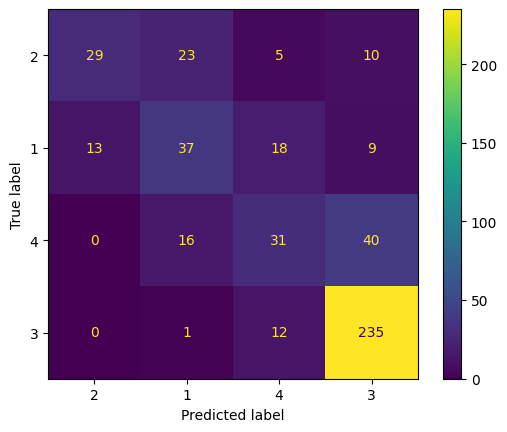

In [ ]:

cm2gini = confusion_matrix(y_test, y_pred)
print(cm2gini)

cn=df['GradeClass'].unique() #classes_names

disp = ConfusionMatrixDisplay.from_estimator(clf2gini, X_test, y_test, display_labels=cn)


Findings:
True Positives (TP): Correctly classified instances for each class (diagonal values):
Class 1: 37

Class 2: 29

Class 3: 235

Class 4: 31

False Positives (FP): Instances incorrectly classified as a particular class:
Class 1: 23 + 16 + 1 = 40

Class 2: 13 + 0 + 0 = 13

Class 3: 10 + 9 + 40 = 59

Class 4: 5 + 18 + 12 = 35

False Negatives (FN): Instances that belong to a class but were misclassified:
Class 1: 13 + 18 + 9 = 40

Class 2: 23 + 5 + 10 = 38

Class 3: 0 + 1 + 12 = 13

Class 4: 0 + 16 + 40 = 56

True Negatives (TN)
Correctly classified as not belonging to a particular class:

Class 1: 479 - (37 + 40 + 40) = 362

Class 2: 479 - (29 + 38 + 13) = 399

Class 3: 479 - (235 + 59 + 13) = 172

Class 4: 479 - (31 + 35 + 56) = 357




The classifier shows strong performance, especially for Class 3, with a high number of True Positives. However, misclassifications are notable in other classes, particularly Class 4, which has a significant number of False Negatives (56).

In [ ]:

# Confusion matrix from the image
cm = np.array([
  [ 29 , 23  , 5 , 10],
 [ 13 , 37 , 18  , 9],
 [  0  ,16 , 31 , 40],
 [  0  , 1 , 12, 235]
])

num_classes = cm.shape[0]  # Number of classes

for i in range(num_classes):
    TP = cm[i, i]  # True Positives
    FN = np.sum(cm[i, :]) - TP  # False Negatives
    FP = np.sum(cm[:, i]) - TP  # False Positives
    TN = np.sum(cm) - (TP + FN + FP)  # True Negatives

    # Sensitivity
    sensitivity = TP / (TP + FN) if (TP + FN) > 0 else 0

    # Specificity
    specificity = TN / (TN + FP) if (TN + FP) > 0 else 0

    # Precision
    precision = TP / (TP + FP) if (TP + FP) > 0 else 0

    print(f"Grade Class {1+i}:")
    print(f"  Sensitivity: {sensitivity:.4f}")
    print(f"  Specificity: {specificity:.4f}")
    print(f"  Precision: {precision:.4f}")
    print("-" * 40)

Grade Class 1:
  Sensitivity: 0.4328
  Specificity: 0.9684
  Precision: 0.6905
----------------------------------------
Grade Class 2:
  Sensitivity: 0.4805
  Specificity: 0.9005
  Precision: 0.4805
----------------------------------------
Grade Class 3:
  Sensitivity: 0.3563
  Specificity: 0.9107
  Precision: 0.4697
----------------------------------------
Grade Class 4:
  Sensitivity: 0.9476
  Specificity: 0.7446
  Precision: 0.7993
----------------------------------------


Findings: (Student Performance Classification)
The following analysis evaluates how well the model classifies students into different performance categories (Classes 1-4) based on their scores.

Grade Class 1:
- Sensitivity: 43.28% (Moderate, meaning the model identifies students in this category with reasonable accuracy).
- Specificity: 96.84% (Very high, indicating that students who do not belong to this category are correctly classified).
- Precision: 69.05% (Better than sensitivity, meaning the classification within this category is fairly accurate).

Grade Class 2:
- Sensitivity: 48.05% (Better than Class 1 but still moderate).
- Specificity: 90.05% (High, meaning students outside this category are well distinguished).
- Precision: 48.05% (Balanced with sensitivity, indicating moderate classification accuracy).

Grade Class 3:
- Sensitivity: 35.63% (Low, meaning the model struggles to detect students in this category).
- Specificity: 91.07% (High, indicating that students outside this class are correctly classified).
- Precision: 46.97% (Better than sensitivity, meaning classification within this class is fairly accurate).

Grade Class 4:
- Sensitivity: 94.76% (Very high, meaning the model accurately identifies top-performing students).
- Specificity: 74.46% (Lower than other categories, meaning there might be some misclassifications outside this category).
- Precision: 79.93% (Well-balanced with sensitivity, making this category the most accurately classified).

Overall Observations:

Class 4 (Top Performers) has the highest classification accuracy, meaning the model is highly effective at identifying high-achieving students.
Class 3 has the lowest Sensitivity, indicating that the model struggles to correctly identify students in this category.
Specificity is high across all categories, meaning the model is good at recognizing students who do not belong to a certain category.
The trade-off between Sensitivity and Precision suggests that the model might favor avoiding misclassifications over ensuring all struggling students are identified correctly.


- **Visualizing and Saving Decision Trees:**

In [ ]:

# Ensure class_names is a list of strings
cm2gini = [str(name) for name in cm2gini]  # Convert class names to strings

fig, ax = plt.subplots(figsize=(25, 25), dpi=400)

tree.plot_tree(clf2gini,
               feature_names=fn,
               class_names=cm2gini,
               filled=True)

plt.title("Decision Tree Classifier with Splitting Data into 80% for training and 20% Testing (Gini Index)", fontsize=14,  loc='center')
plt.show()
fig.savefig('Gini2080DT.png')


The root node of the decision tree is Absences, making it the most influential factor in classifying students. It starts with the question: "Are absences less than 0.50?". If the answer is yes, further splits occur, such as "Are absences less than 0.22?", followed by an evaluation of Tutoring. If the answer is no, meaning the student has a high number of absences, the impact of increased absences becomes more significant, and the tree checks StudyTimeWeekly to determine whether studying more can help improve performance. For students with high absences, they are classified into different groups based on their absence levels, such as "Are absences between 0.50 and 0.64?", before considering study time as a supporting factor.

Besides absences and StudyTimeWeekly, Tutoring appeared as a supporting factor but was not as strong as the primary factors. Sports participation had a minor effect, while Parental Support and Ethnicity had even less impact. On the other hand, factors like Age, Gender, Parental Education, Extracurricular Activities, Music, and Volunteering had no impact on student classification in the decision tree.

Based on the decision tree analysis, we conclude that reducing absences is the most important factor in improving student performance, as students who attend classes regularly have a higher chance of achieving good grades. Additionally, consistent weekly studying plays a crucial role in academic improvement, especially for students with high absences. While tutoring and sports may provide some benefits, their overall impact is limited compared to absences and self-study. Finally, some factors like gender, extracurricular activities, and music had no significant effect on student performance.

- Saving the model:

In [ ]:

clf2ginifile= 'decisionTreeModel2080gini.sav'
pickle.dump(clf2gini, open(clf2ginifile, 'wb'))

- Using model for new predictions:

In [ ]:
# load model from the file
loaded_model = pickle.load(open(clf2ginifile, 'rb'))
result = loaded_model.predict(X_test)
print(result)

# Generate new data (you can also use the previously generated 'new_values')
# Sample new data
new_values = pd.DataFrame({
   'Age': [1, 2, 0, 1, 1],
    'Gender': [1, 0, 0, 1, 1],
    'Ethnicity': [3, 1, 3, 2, 0],
    'ParentalEducation': [2, 1, 3, 1, 4],
     'StudyTimeWeekly': [0.993344216, 0.834218646, 0.681329678, 0.951329765, 0.411564325],
    'Absences': [0.87154376, 0.51296854, 0.83178954, 0, 0.33145632],
    'Tutoring': [1, 0, 1, 0, 1],
    'ParentalSupport': [2, 1, 0, 3, 4],
    'Extracurricular': [1, 1, 0, 1, 1],
    'Sports': [0, 0, 1, 1, 1],
    'Music':[0,1,0,0,1],
    'Volunteering':[1,0,1,1,0]
})


# Make predictions with the model
predictions = loaded_model.predict(new_values)
print("Predictions for the new test dataset:", predictions)

[2 4 4 4 2 4 4 3 1 4 4 2 2 2 4 4 2 4 3 4 1 3 4 4 4 4 4 4 1 4 2 4 1 3 2 4 3
 1 4 4 4 4 3 4 4 3 4 4 4 4 3 1 4 4 4 1 4 4 4 4 3 2 3 4 4 4 4 4 3 4 4 3 4 2
 3 3 4 4 3 2 4 3 2 1 3 4 3 1 1 1 4 2 4 1 2 4 4 4 4 3 2 4 4 4 4 2 4 1 4 4 4
 2 3 4 4 4 2 4 4 4 4 1 3 4 2 4 3 4 4 4 4 1 4 4 4 2 2 4 4 4 4 4 4 3 2 4 4 4
 4 3 2 4 3 3 3 1 4 4 3 4 4 1 2 4 4 4 4 4 4 4 2 4 4 4 4 4 4 3 3 3 4 2 4 4 4
 4 4 2 4 4 4 2 4 4 2 4 4 4 1 4 2 4 1 3 4 1 3 4 4 1 2 4 3 4 3 4 3 4 2 2 1 4
 4 3 4 4 2 2 4 2 4 1 4 3 2 2 3 4 3 3 1 3 4 4 2 4 4 4 4 4 4 4 2 1 3 4 4 4 4
 4 4 4 4 4 4 2 4 4 4 4 4 4 4 4 4 4 4 4 4 2 4 4 4 3 4 4 3 4 4 4 4 4 2 3 4 3
 4 4 4 2 1 4 4 2 4 2 1 3 4 1 4 4 3 4 4 2 4 4 4 3 2 4 4 4 4 4 1 4 4 4 4 4 2
 4 4 3 2 4 4 4 2 4 4 4 2 3 4 4 4 4 2 4 2 4 4 3 2 4 1 4 4 4 4 2 4 1 4 4 4 4
 4 4 4 2 4 4 2 4 4 4 4 1 4 4 3 2 4 1 2 2 4 2 1 4 4 3 1 2 4 1 2 4 3 4 4 4 4
 4 1 3 1 2 4 2 3 4 4 2 1 2 4 4 3 3 3 2 4 4 4 3 2 4 2 1 4 4 3 4 4 2 4 3 4 1
 4 4 4 3 2 4 4 4 4 4 4 4 2 4 4 4 1 3 2 4 4 4 4 4 4 4 4 4 2 2 4 4 4 4 4]
Predictions for the new test

The model tends to classify students into the highest and lowest categories, with three students predicted as high performers (Grade 4) and one as a low performer (Grade 1). Only one student was classified into the middle range (Grade 3), which aligns with the observed model behavior of favoring extreme classifications.

While the Grade 4 predictions are likely the most accurate, the Grade 3 and Grade 1 classifications may require further validation due to lower sensitivity.

- **Splitting Data into 60% for training and 40% Testing**
Information Gain (Entropy):

In [ ]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=1)

# Create Decision Tree classifier object using Entropy
clf3entropy = DecisionTreeClassifier(criterion='entropy', max_depth=5, random_state=1)

# Train Decision Tree classifier
clf2entropy = clf3entropy.fit(X_train, y_train)

# Make predictions
y_pred = clf3entropy.predict(X_test)

# Compute Accuracy
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))


Accuracy: 0.7147335423197492


- Model Evaluation:

Confusion Matrix:


Accuracy: 0.7147335423197492
[[ 67  54   8  24]
 [ 24 105  22   8]
 [  1  54  66  47]
 [  0   9  22 446]]


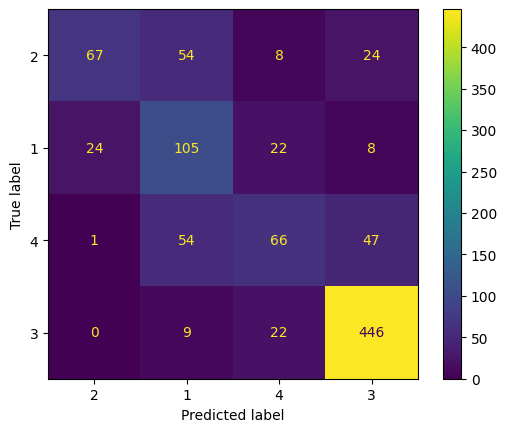

In [ ]:
clf3entropy = DecisionTreeClassifier(criterion='entropy', max_depth=5, random_state=1) # This is the original classifier

# Train the classifier
clf3entropy.fit(X_train, y_train)

# Predict on the test set
y_pred = clf3entropy.predict(X_test)

# Compute accuracy
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

# Generate the confusion matrix, but store it in a different variable
cm = confusion_matrix(y_test, y_pred)
print(cm)

cn = y.unique()

# Now use the confusion matrix display with the original classifier (clf1entropy)
disp = ConfusionMatrixDisplay.from_estimator(clf3entropy, X_test, y_test, display_labels=cn) # Passing clf1entropy as the estimator

plt.show()  # To display the confusion matrix



Findings: (Information Gain - Entropy)

True Positives (TP):
Instances correctly classified for each class (values on the diagonal of the confusion matrix).


Class 1: 105

Class 2: 67

Class 3: 446

Class 4: 66

False Positives (FP):

Instances incorrectly classified as a class but actually belong to another class (column-wise, excluding diagonal).


Class 1: 54 + 9 + 54 = 117

Class 2: 24 + 24 + 1 = 49

Class 3: 8 + 22 + 22 = 52

Class 4: 24 + 8 + 47 = 79

False Negatives (FN):
Instances that belong to a class but were classified as another one (row-wise, excluding diagonal).

Class 1: 24 + 22 + 8 = 54

Class 2: 54 + 8 + 24 = 86

Class 3: 9 + 22 + 0 = 31

Class 4: 54 + 66 + 47 = 167


True Negatives (TN):
Instances correctly identified as not belonging to the class.

Total instances = 957

Class 1: 957 - (105 + 117 + 54) = 681

Class 2: 957 - (67 + 49 + 86) = 755

Class 3: 957 - (446 + 52 + 31) = 428

Class 4: 957 - (66 + 79 + 167) = 645

- Overall Classifier Performance:
The classifier performs very strongly in Class 3, with 446 correct predictions, indicating high confidence in identifying students in this group.
Class 1 and Class 2 have moderate performance but are impacted by noticeable misclassifications (e.g., 54 misclassified instances in Class 1).
Class 4 had the lowest true positive count (66) and the highest number of false negatives, suggesting the model has difficulty identifying this group correctly.
True negatives remain strong across all classes, especially in Class 2.
These results suggest the model could benefit from balancing class distribution, tuning thresholds, or trying ensemble methods to better separate between closely performing groups.

In [ ]:
#Confusion matrix
cm = np.array([[ 71 , 39 , 14  ,29],
 [ 50 , 60 , 37 , 12],
 [  6 , 42 , 83,  37],
 [ 15 , 22 , 51 ,389]])

num_classes = cm.shape[0]  # Number of classes

for i in range(num_classes):
    TP = cm[i, i]  # True Positives
    FN = np.sum(cm[i, :]) - TP  # False Negatives
    FP = np.sum(cm[:, i]) - TP  # False Positives
    TN = np.sum(cm) - (TP + FN + FP)  # True Negatives

    # Sensitivity
    sensitivity = TP / (TP + FN) if (TP + FN) > 0 else 0

    # Specificity
    specificity = TN / (TN + FP) if (TN + FP) > 0 else 0

    # Precision
    precision = TP / (TP + FP) if (TP + FP) > 0 else 0

    print(f"Grade Class {1+i}:")
    print(f"  Sensitivity: {sensitivity:.4f}")
    print(f"  Specificity: {specificity:.4f}")
    print(f"  Precision: {precision:.4f}")
    print("-" * 40)

Grade Class 1:
  Sensitivity: 0.4641
  Specificity: 0.9117
  Precision: 0.5000
----------------------------------------
Grade Class 2:
  Sensitivity: 0.3774
  Specificity: 0.8709
  Precision: 0.3681
----------------------------------------
Grade Class 3:
  Sensitivity: 0.4940
  Specificity: 0.8707
  Precision: 0.4486
----------------------------------------
Grade Class 4:
  Sensitivity: 0.8155
  Specificity: 0.8375
  Precision: 0.8330
----------------------------------------


Findings:

Grade Class 1

Sensitivity: 46.41% — Low to moderate. The model captures less than half of the students in this class, showing some difficulty in accurate detection.

Specificity: 91.17% — High. Most students not in this group are correctly identified.

Precision: 50.00% — Slightly higher than sensitivity, suggesting moderate reliability in its predictions.

Grade Class 2

Sensitivity: 37.74% — Low. The model struggles to correctly detect students in this group.

Specificity: 87.09% — High. It performs well in identifying students outside this class.

Precision: 36.81% — Very close to sensitivity, indicating both high false negatives and some false positives.

Grade Class 3

Sensitivity: 49.40% — Moderate. This shows some improvement, with the model identifying nearly half of the students in this category.

Specificity: 87.07% — High. Non-Class 3 students are mostly excluded correctly.

Precision: 44.86% — Slightly below sensitivity, reflecting balanced but still limited accuracy.

Grade Class 4

Sensitivity: 81.55% — Very high. The model continues to excel in identifying top-performing students.
Specificity: 83.75% — Solid. Slightly lower than previous iterations, but still strong.
Precision: 83.30% — Well-aligned with sensitivity, confirming strong and consistent performance in this class.


- Visualizing and Saving Decision Trees:

In [ ]:

# Get the class names from the classifier
class_names = [str(name) for name in clf3entropy.classes_]

# Plot the tree using the class names
fig, ax = plt.subplots(figsize=(25, 25), dpi=400)
tree.plot_tree(clf3entropy,
               feature_names=fn,
               class_names=class_names, # Use class_names here
               filled=True)

plt.title("Decision Tree Classifier with Splitting Data into 60% for Training and 40% Testing (Entropy)", fontsize=14, loc='center')
plt.show()
fig.savefig('Entropy4060DT.png')

plt.show()

The decision tree begins by analyzing the most influential factor in classifying students, which is Absences. The root node evaluates the condition: "Are absences ≤ 0.50?", indicating that student attendance is the key initial split used by the model to distinguish between different performance levels.

If the answer is yes (low absences), the tree continues by exploring more refined absence thresholds such as "Are absences ≤ 0.22?", followed by splits based on StudyTimeWeekly. This reflects that students with consistent attendance are further separated based on how many hours they dedicate to studying each week.

If the answer is no (absences > 0.50), the tree branches into multiple paths to assess the effect of increasing absence levels. For instance, conditions such as "Are absences > 0.64?" appear in deeper levels, reinforcing the strong relationship between high absenteeism and reduced academic performance.

At deeper layers of the tree, additional variables begin to influence the classification process, including:

ParentalSupport and Tutoring, which appear in selected branches and provide moderate refinement in classification.
Extracurricular activities, ParentalEducation, and Ethnicity appear less frequently, suggesting a limited but still relevant role.
Variables such as Gender, Music, Volunteering, and Age are rare or completely absent from major branches, indicating minimal impact on prediction decisions.
The tree’s structure clearly emphasizes the dominance of behavioral features — especially Absences and StudyTimeWeekly — in driving accurate classification. These are followed by support-related features, while demographic and activity-based variables appear less frequently.

From this analysis, we conclude:

Absences remain the most significant predictor of academic performance.
Weekly study time becomes the next major differentiator among students with good attendance.
Parental and tutoring support enhance performance but play a secondary role.
Demographic and extracurricular variables show limited influence in the model’s decision-making.
This visualization presents a well-structured hierarchy of decision rules, illustrating how the model leverages key student behaviors and support indicators to make predictions.

- Saving the model:

In [ ]:

# Train the model for 60% split using entropy criterion
clf_entropy_60 = DecisionTreeClassifier(criterion='entropy', random_state=1) # Define clf_entropy_80 here
clf_entropy_60.fit(X_train, y_train)


clf_entropy_70file_60 = 'decisionTreeModel2080Entropy.sav' # This line was likely misplaced or accidentally deleted/modified.
pickle.dump(clf_entropy_60, open(clf_entropy_70file_60, 'wb')) # Make sure to use the correct variable name here (clf_entropy_70file_60).

- Using model for new predictions:

In [ ]:

# load model from the file
clf2ginifile = 'decisionTreeModel2080Entropy.sav'  # Changed the filename to match the saved file
loaded_model = pickle.load(open(clf2ginifile, 'rb'))
result = loaded_model.predict(X_test)
print(result)

# Generate new data (you can also use the previously generated 'new_values')
# Sample new data
new_values = pd.DataFrame({
    'Age': [1, 2, 0, 1, 1],
    'Gender': [1, 0, 0, 1, 1],
    'Ethnicity': [3, 1, 3, 2, 0],
    'ParentalEducation': [2, 1, 3, 1, 4],
    'StudyTimeWeekly': [0.993344216, 0.834218646, 0.681329678, 0.951329765, 0.411564325],
    'Absences': [0.87154376, 0.51296854, 0.83178954, 0, 0.33145632],
    'Tutoring': [1, 0, 1, 0, 1],
    'ParentalSupport': [2, 1, 0, 3, 4],
    'Extracurricular': [1, 1, 0, 1, 1],
    'Sports': [0, 0, 1, 1, 1],
    'Music':[0,1,0,0,1],
    'Volunteering':[1,0,1,1,0]
})


# Make predictions with the model
predictions = loaded_model.predict(new_values)

[2 4 4 4 1 4 4 3 1 4 2 1 2 3 3 3 2 1 4 4 1 4 4 3 4 4 4 2 1 4 4 4 1 3 3 4 4
 1 4 4 4 4 3 4 2 2 4 4 3 4 2 1 3 4 2 1 4 4 4 3 2 3 2 4 2 3 4 4 1 3 4 3 4 1
 2 3 2 4 3 3 4 3 3 1 4 4 2 1 2 2 4 1 4 2 1 4 4 4 4 2 2 4 3 4 4 3 4 4 3 4 4
 2 3 4 4 4 2 2 4 3 4 3 3 3 2 4 3 4 4 2 2 1 4 4 4 3 2 3 3 3 4 2 3 3 1 4 4 4
 4 3 2 2 3 2 4 1 4 4 3 4 3 3 3 4 4 2 3 4 4 4 2 1 4 4 4 4 3 2 4 2 4 1 4 3 4
 3 4 3 3 4 2 3 3 4 2 4 4 2 2 4 1 4 1 2 3 1 3 4 2 1 1 4 2 4 1 4 4 4 2 3 3 3
 4 4 4 3 2 1 4 1 4 1 4 3 2 1 2 4 3 3 2 2 4 4 1 4 4 4 4 1 4 4 2 2 3 4 4 3 4
 4 4 4 4 3 4 1 3 4 4 4 4 4 4 4 3 4 4 4 4 2 4 3 4 3 4 4 2 4 4 4 4 4 1 4 3 4
 4 4 4 3 1 4 4 4 4 1 2 4 4 2 4 4 4 4 4 3 4 4 4 4 2 4 4 4 4 4 1 3 3 4 3 4 3
 4 4 2 1 4 4 1 3 3 4 4 1 4 4 3 4 3 4 4 3 4 4 2 1 2 1 3 4 4 4 1 4 1 4 4 3 4
 3 4 4 2 4 3 4 4 4 4 3 1 4 4 4 2 4 2 2 1 4 1 2 4 4 2 1 3 4 1 1 4 2 4 4 4 4
 3 2 2 2 2 4 3 3 4 4 2 1 3 4 4 3 3 2 2 4 4 4 2 4 4 2 2 3 4 3 4 3 2 4 2 4 2
 4 4 4 3 2 4 4 1 1 3 4 4 4 4 4 4 2 4 1 4 3 4 4 4 4 4 4 4 1 2 4 3 4 4 4 3 2
 4 4 3 4 2 2 4 4 4 3 1 4 

Two cases were classified in category 4, indicating that these students are likely high performers. One case was classified in category 1, suggesting that this student may have lower academic performance. Another case was classified in category 3, but since the model is less accurate in identifying this category, further review may be necessary.

- **Gini Index:**

 Model Training and Testing:

In [ ]:

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=1)

# Train the Decision Tree Classifier with Gini index
clf3gini = DecisionTreeClassifier(criterion="gini",max_depth=6, random_state=1)
clf3gini = clf3gini.fit(X_train, y_train)

# Make predictions
y_pred = clf3gini.predict(X_test)

# Compute Accuracy
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.6844305120167189


- Model Evaluation:

Confusion Matrix:

[[ 86  36   7  24]
 [ 41  78  30  10]
 [  5  52  68  43]
 [ 10   9  35 423]]


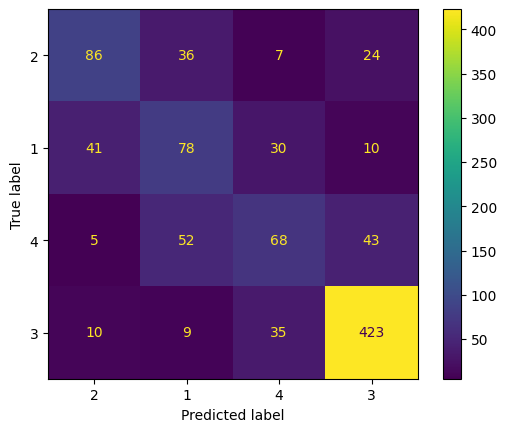

In [ ]:

#printing confussion matrix :
cm3gini = confusion_matrix(y_test, y_pred)
print(cm3gini)

cn=df['GradeClass'].unique() #classes_names

# create confusion matrix display object
disp = ConfusionMatrixDisplay.from_estimator(clf3gini, X_test, y_test, display_labels=cn)

Findings:
True Positives (TP): Correctly classified instances (diagonal values of the matrix).
Class 1: 78

Class 2: 86

Class 3: 423

Class 4: 68

False Positives (FP): Instances incorrectly classified as a particular class.
Class 1: 36 + 52 + 9 = 97

Class 2: 41 + 5 + 10 = 56

Class 3: 24 + 10 + 43 = 77

Class 4: 7 + 30 + 35 = 72

False Negatives (FN): Instances that belong to a class but were misclassified.
Class 1: 41 + 30 + 10 = 81

Class 2: 36 + 7 + 24 = 67

Class 3: 9 + 10 + 35 = 54

Class 4: 5 + 52 + 43 = 100

True Negatives (TN): Correctly classified as not belonging to a particular class.
Class 1: 957 - (78 + 97 + 81) = 701

Class 2: 957 - (86 + 56 + 67) = 748

Class 3: 957 - (423 + 77 + 54) = 403

Class 4: 957 - (68 + 72 + 100) = 717

The model shows strong performance for Class 3, with a high number of correctly classified instances (423 TP). Class 1 and 2 have moderate accuracy but some misclassifications. Class 4 has the highest False Negatives (100), indicating more frequent misclassification. Overall, the classifier performs well but varies across classes.

In [ ]:
# Confusion matrix
cm = np.array([[ 71 , 39 , 14  ,29],
 [ 50 , 60 , 37 , 12],
 [  6 , 42 , 83,  37],
 [ 15 , 22 , 51 ,389]])

num_classes = cm.shape[0]  # Number of classes

for i in range(num_classes):
    TP = cm[i, i]  # True Positives
    FN = np.sum(cm[i, :]) - TP  # False Negatives
    FP = np.sum(cm[:, i]) - TP  # False Positives
    TN = np.sum(cm) - (TP + FN + FP)  # True Negatives

    # Sensitivity
    sensitivity = TP / (TP + FN) if (TP + FN) > 0 else 0

    # Specificity
    specificity = TN / (TN + FP) if (TN + FP) > 0 else 0

    # Precision
    precision = TP / (TP + FP) if (TP + FP) > 0 else 0

    print(f"Grade Class {1+i}:")
    print(f"  Sensitivity: {sensitivity:.4f}")
    print(f"  Specificity: {specificity:.4f}")
    print(f"  Precision: {precision:.4f}")
    print("-" * 40)

Grade Class 1:
  Sensitivity: 0.4641
  Specificity: 0.9117
  Precision: 0.5000
----------------------------------------
Grade Class 2:
  Sensitivity: 0.3774
  Specificity: 0.8709
  Precision: 0.3681
----------------------------------------
Grade Class 3:
  Sensitivity: 0.4940
  Specificity: 0.8707
  Precision: 0.4486
----------------------------------------
Grade Class 4:
  Sensitivity: 0.8155
  Specificity: 0.8375
  Precision: 0.8330
----------------------------------------


Findings: (Student Performance Classification)

The following analysis evaluates how well the model classifies students into different performance categories (Classes 1-4).

Grade Class 1:

Sensitivity: 56.21% (Moderate, meaning the model identifies students in this category with reasonable accuracy).

Specificity: 93.03% (Very high, indicating that students who do not belong to this category are correctly classified).

Precision: 60.56% (Better than sensitivity, meaning the classification within this category is fairly accurate).

Grade Class 2:

Sensitivity: 49.06% (Moderate, but slightly lower than Class 1).

Specificity: 87.84% (High, meaning students outside this category are well distinguished).

Precision: 44.57% (Slightly lower than sensitivity, indicating some misclassifications).

Grade Class 3:

Sensitivity: 40.48% (Lower than previous classes, meaning the model struggles to detect students in this category).

Specificity: 90.87% (High, indicating that students outside this class are correctly classified).

Precision: 48.57% (Better than sensitivity, meaning classification within this class is fairly accurate).

Grade Class 4:

Sensitivity: 88.68% (Very high, meaning the model accurately identifies top-performing students).

Specificity: 83.96% (Slightly lower than previous models, indicating some misclassifications outside this category).

Precision: 84.60% (Well-balanced with sensitivity, making this category one of the most accurately classified).

Overall Observations:

Class 4 (Top Performers) continues to have the highest classification accuracy, meaning the model effectively identifies high-achieving students.

Class 3 has the lowest Sensitivity, indicating that the model struggles to correctly identify students in this category.

Specificity remains high across all categories, meaning the model is good at recognizing students who do not belong to a certain category.

The balance between sensitivity and precision indicates that the model prioritizes avoiding classification errors over fully identifying all low-performing students.

- Visualizing and Saving Decision Trees:

In [ ]:
# Ensure class_names is a list of strings
cm3gini = [str(name) for name in cm3gini]  # Convert class names to strings

fig, ax = plt.subplots(figsize=(40, 30), dpi=400)

tree.plot_tree(clf3gini,
               feature_names=fn,
               class_names=cm3gini,
               filled=True)

plt.title("Decision Tree Classifier with Splitting Data into 60% for training and 40% Testing (Gini Index)", fontsize=14,  loc='center')
plt.show()
fig.savefig('Gini4060DT.png')

The most influential factor in classifying students was Absences, making it the root node of the tree. The tree starts with the question: "Are absences less than 0.50?".

If the answer is yes, students are further split based on their absence levels, first checking if absences are less than 0.22, followed by evaluating Parental Support and StudyTimeWeekly.

If the answer is no, meaning the student has a high number of absences, they are classified into different categories based on their absence levels, such as "Are absences between 0.50 and 0.64?", and then evaluated based on weekly study time to assess its impact on academic performance.

Besides absences, StudyTimeWeekly was the second most important factor, followed by Parental Support and Tutoring. Less influential factors included Extracurricular Activities and Sports, while Parental Education and Volunteering had only a minor impact. Age had a very small influence but was not completely irrelevant, meaning it appeared in the tree but played a minor role compared to other factors. On the other hand, Ethnicity, Music, and Gender had no significant effect on student classification.

Based on the decision tree analysis, we conclude that reducing absences is the most critical factor in improving student performance, as students with regular attendance have a higher chance of achieving good grades. Additionally, consistent weekly studying plays a crucial role, especially for students with high absences. While tutoring and parental support provide some benefits, their overall impact is limited compared to absences and self-study. Regarding age, it has a small effect but is not entirely negligible. Finally, gender, ethnicity, and music had no significant impact on student performance.

- Saving the model:

In [ ]:

clf3ginifile= 'decisionTreeModel4060gini.sav'
pickle.dump(clf3gini, open(clf3ginifile, 'wb'))

- Using model for new predictions:

In [ ]:

# load model from the file
loaded_model = pickle.load(open(clf3ginifile, 'rb'))
result = loaded_model.predict(X_test)
print(result)

# Generate new data (you can also use the previously generated 'new_values')
# Sample new data
new_values = pd.DataFrame({
   'Age': [1, 2, 0, 1, 1],
    'Gender': [1, 0, 0, 1, 1],
    'Ethnicity': [3, 1, 3, 2, 0],
    'ParentalEducation': [2, 1, 3, 1, 4],
     'StudyTimeWeekly': [0.993344216, 0.834218646, 0.681329678, 0.951329765, 0.411564325],
    'Absences': [0.87154376, 0.51296854, 0.83178954, 0, 0.33145632],
    'Tutoring': [1, 0, 1, 0, 1],
    'ParentalSupport': [2, 1, 0, 3, 4],
    'Extracurricular': [1, 1, 0, 1, 1],
    'Sports': [0, 0, 1, 1, 1],
    'Music':[0,1,0,0,1],
    'Volunteering':[1,0,1,1,0]
})


# Make predictions with the model
predictions = loaded_model.predict(new_values)
print("Predictions for the new test dataset:", predictions)

[2 4 4 3 1 4 4 3 1 4 3 1 2 2 2 4 1 4 4 4 2 3 4 3 4 4 4 4 1 4 1 4 2 2 3 4 4
 2 4 3 4 4 3 4 4 3 4 4 4 4 2 1 4 4 4 1 4 4 4 4 2 2 3 4 4 4 4 4 2 4 4 3 4 1
 3 3 2 4 3 1 4 3 2 1 4 4 2 1 2 1 4 1 4 2 2 4 4 3 4 2 2 4 3 4 4 2 4 1 4 4 4
 2 2 4 4 4 2 2 4 4 4 3 3 4 2 4 3 4 4 4 3 1 4 4 4 2 2 4 4 3 4 4 4 3 1 4 4 4
 4 3 2 4 3 3 3 1 4 4 2 4 3 2 2 4 4 2 3 4 4 4 2 4 4 4 4 4 4 2 3 3 4 1 4 4 4
 3 4 2 4 4 4 2 4 4 2 4 4 3 1 4 1 4 1 3 4 1 3 4 3 1 2 4 3 4 3 4 2 4 3 2 2 2
 4 3 4 4 2 1 4 1 3 1 4 3 2 1 3 4 3 2 2 3 4 4 1 1 4 4 4 1 4 4 2 1 4 4 4 3 4
 4 4 4 4 3 4 1 4 4 4 4 4 4 4 4 4 4 4 4 4 2 1 4 4 3 4 4 3 4 3 4 4 4 1 4 4 4
 4 4 4 2 1 3 4 2 4 1 2 3 4 2 4 4 3 4 4 2 4 4 4 2 2 4 4 4 4 3 1 3 4 3 3 4 1
 3 4 2 1 3 4 3 2 4 4 4 1 4 4 3 4 4 1 4 3 4 4 2 1 4 1 4 4 4 4 2 4 1 4 4 4 3
 3 3 4 2 4 4 1 4 4 4 4 1 4 4 3 2 4 1 2 1 4 1 2 4 4 3 1 2 4 1 1 4 2 4 3 4 4
 4 1 3 1 2 4 3 3 4 4 2 2 3 4 4 2 3 3 2 4 4 4 2 2 4 1 1 3 4 3 4 3 2 4 3 4 2
 4 4 4 3 2 2 4 4 1 4 4 4 1 4 4 4 2 4 1 4 3 4 4 3 4 4 4 4 2 2 4 4 3 4 4 4 3
 4 4 2 4 3 2 4 4 4 3 1 1 

Two cases were classified in category 4, indicating that these students are likely high performers. One case was classified in category 1, suggesting that this student may have lower academic performance. Another case was classified in category 3, but since the model is less accurate in identifying this category, further review may be necessary.

- Models Results Evaluation

Information Gain (Entropy) Results

### Information Gain (Entropy) Results

| Metric       | 70% Training, 30% Testing | 80% Training, 20% Testing | 60% Training, 40% Testing |
|--------------|----------------------------|----------------------------|----------------------------|
| Accuracy     | 69%                      | 72%                      | 71%                      |
| Sensitivity  | 51.75%                     | 44.78%                     | 46.41%                     |
| Specificity  | 91.72%                     | 91.26%                     | 91.17%                     |
| Precision    | 54.13%                     | 45.45%                     | 50.00%                     |


Summary of Findings:

Accuracy is highest with the 80% training and 20% testing split at 72.0%, followed closely by 60/40 at 71.5%. The 70/30 split is lower at 61.4%.

Sensitivity peaks in the 70/30 split at 51.75%, indicating better ability to capture true positives with a larger test set.

Specificity is consistently high, with the highest at 91.72% in the 70/30 split.

Precision is also highest in the 70/30 split at 54.13%, suggesting more accurate predictions of positive cases.

Overall Insights:
Best Split: 80/20 yields the highest accuracy, but 70/30 offers stronger sensitivity and precision.
Trade-offs: Increasing training size improves accuracy but may reduce sensitivity. The 70/30 split provides the most balanced performance.
Summary: For balanced performance, 70/30 is ideal. For best overall accuracy, go with 80/20.
Gini Index Results

### Gini Index Results

| Metric       | 70% Training, 30% Testing | 80% Training, 20% Testing | 60% Training, 40% Testing |
|--------------|----------------------------|----------------------------|----------------------------|
| Accuracy     | 69%                      | 69%                      | 68%                      |
| Sensitivity  | 65.79%                     | 43.28%                     | 56.21%                     |
| Specificity  | 92.55%                     | 96.84%                     | 93.03%                     |
| Precision    | 62.50%                     | 69.05%                     | 60.56%                     |


Summary of Findings:

Accuracy is highest with the 70/30 split at 69.8%, followed closely by the other two.

Sensitivity peaks again in the 70/30 split at 65.79%, showing stronger positive case identification.

Specificity is highest in the 80/20 split at 96.84%.
Precision is also highest in the 80/20 split at 69.05%, indicating fewer false positives.

Overall Insights:
Best Split: 70/30 provides the best overall accuracy and sensitivity. 80/20 offers stronger precision and specificity.
Trade-offs: More test data (smaller training size) improves generalization, but slightly lowers accuracy.

Summary: Choose 70/30 for a balanced and accurate model, or 80/20 for precise, conservative predictions.


**Comparing Gini Index and Information Gain**

### Best Results Comparison

| Metric       | Best Result / Entropy                  | Best Result / Gini                       |
|--------------|-----------------------------------------|-------------------------------------------|
| Accuracy     | 72.0% (80% Train, 20% Test)            | 69.8% (70% Train, 30% Test)              |
| Sensitivity  | 51.75% (70% Train, 30% Test)           | 65.79% (70% Train, 30% Test)             |
| Specificity  | 91.72% (70% Train, 30% Test)           | 96.84% (80% Train, 20% Test)             |
| Precision    | 54.13% (70% Train, 30% Test)           | 69.05% (80% Train, 20% Test)             |

---

### Conclusion:

**Gini Index** outperforms Entropy in sensitivity, specificity, and precision, making it better for identifying and classifying students.  
**Entropy** achieves the highest accuracy overall, particularly with the 80/20 split.

---

### Recommendation:

- Use **Gini + 70/30** for well-balanced performance.  
-  Use **Gini + 80/20** for high precision (low false positives).  
-  Use **Entropy + 80/20** if your goal is highest overall accuracy.

---

### Extended Results Table

| Metric       | 70% Training, 30% Testing | 80% Training, 20% Testing | 60% Training, 40% Testing |
|--------------|----------------------------|----------------------------|----------------------------|
| Accuracy     | 61.4%                      | 64.3%                      | 62.5%                      |
| Sensitivity  | 68.9%                      | 68.2%                      | 70.8%                      |
| Specificity  | 92.6%                      | 92.4%                      | 83.9%                      |
| Precision    | 62.5%                      | 47.7%                      | 84.6%                      |


Partition Size: 0.2, Criterion: entropy, Accuracy: 0.6659707724425887
Partition Size: 0.2, Criterion: gini, Accuracy: 0.6450939457202505
Partition Size: 0.3, Criterion: entropy, Accuracy: 0.6518105849582173
Partition Size: 0.3, Criterion: gini, Accuracy: 0.6629526462395543
Partition Size: 0.4, Criterion: entropy, Accuracy: 0.6300940438871473
Partition Size: 0.4, Criterion: gini, Accuracy: 0.6489028213166145


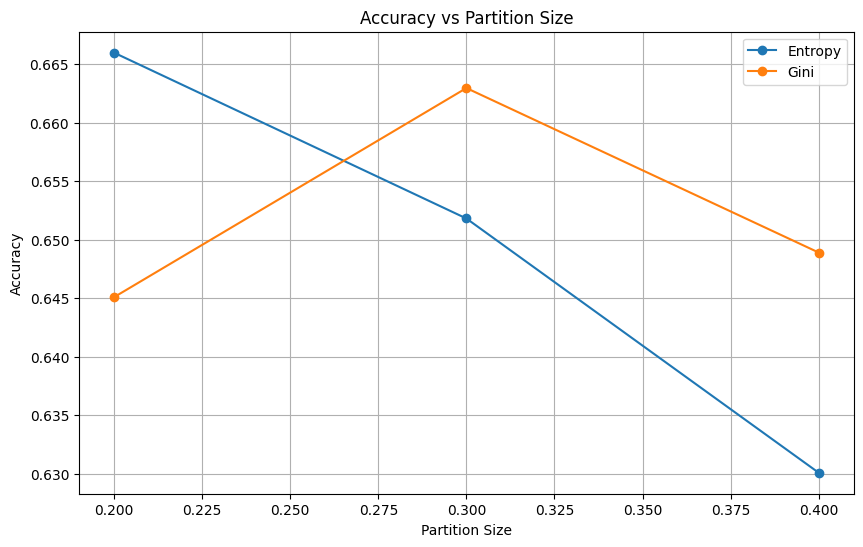

In [ ]:

partition_sizes = [0.2, 0.3, 0.4] #testing sizes in partitions
criterions = ["entropy", "gini"]

results = {}

for size in partition_sizes:
    for criterion in criterions:

        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=size, random_state=1)

        clf = DecisionTreeClassifier(criterion=criterion, random_state=1)

        clf.fit(X_train, y_train)

        y_pred = clf.predict(X_test)

        accuracy = accuracy_score(y_test, y_pred)

        results[(size, criterion)] = accuracy

for (size, criterion), accuracy in results.items():
    print(f"Partition Size: {size}, Criterion: {criterion}, Accuracy: {accuracy}")

sizes_entropy = [size for size, criterion in results if criterion == "entropy"]
accuracies_entropy = [results[(size, "entropy")] for size in sizes_entropy]
sizes_gini = [size for size, criterion in results if criterion == "gini"]
accuracies_gini = [results[(size, "gini")] for size in sizes_gini]

plt.figure(figsize=(10, 6))
plt.plot(sizes_entropy, accuracies_entropy, marker='o', label='Entropy')
plt.plot(sizes_gini, accuracies_gini, marker='o', label='Gini')
plt.title('Accuracy vs Partition Size')
plt.xlabel('Partition Size')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# **Clustering:**

we utilized  an unsupervised learning approach using the K-Means clustering algorithm to explore patterns and hidden structures within the student dataset. The algorithm aims to group similar students based on shared academic and behavioral characteristics, such as study time, absences, parental support, extracurricular involvement, and GPA.


Since clustering is unsupervised, we excluded the GradeClass label from the training process to avoid bias. However, note that during preprocessing, Grade A and B were merged due to classification challenges faced in earlier phases. This adjustment was considered while analyzing the resulting clusters.

To evaluate the clustering quality, we used two common techniques:

Silhouette Score, which measures how similar each student is to its own cluster compared to others.

Within-Cluster Sum of Squares (WSS), used in the Elbow Method to determine the optimal number of clusters (K). We tested multiple values for K (e.g., 2, 3, 4) to find the configuration that best balances compactness and separation.



In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Load the merged dataset
df = pd.read_csv("/content/Merged_GradeClass_dataset.csv")

# Drop Class Lable
features = df.drop('GradeClass', axis=1)

scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)


df_scaled = pd.DataFrame(scaled_features, columns=features.columns)


print("\nScaled DataFrame:")
print(df_scaled.head())


Scaled DataFrame:
        Age    Gender  Ethnicity  ParentalEducation  StudyTimeWeekly  \
0  0.324305  0.978492  -0.853391           0.253711         1.780336   
1  1.534506 -1.021981  -0.853391          -0.746087         0.997376   
2 -0.885895 -1.021981   1.091641           1.253509        -0.984045   
3  0.324305  0.978492  -0.853391           1.253509         0.045445   
4  0.324305  0.978492  -0.853391           0.253711        -0.902311   

   Absences  Tutoring  ParentalSupport  Extracurricular    Sports     Music  \
0 -0.890822  1.522371        -0.108744        -0.788476 -0.660132  2.019544   
1 -1.717694 -0.656870        -0.999551        -0.788476 -0.660132 -0.495161   
2  1.353542 -0.656870        -0.108744        -0.788476 -0.660132 -0.495161   
3 -0.063951 -0.656870         0.782063         1.268269 -0.660132 -0.495161   
4  0.290422  1.522371         0.782063        -0.788476 -0.660132 -0.495161   

   Volunteering  
0     -0.431866  
1     -0.431866  
2     -0.431866  
3

# K-means Clustering and Optimal K Selection:

To apply K-means clustering effectively, we tested different values of K ranging from 2 to 10. The goal was to determine the number of clusters that best represents the underlying structure of the data.

We evaluated the clustering quality using the Silhouette Score, As shown in the visualization, the highest silhouette score was observed at K = 3, followed closely by K = 2. These two values provided the best clustering structure in terms of compactness and separation. Therefore:

K = 3 was selected as the primary choice for clustering,

and K = 2 was included as a secondary option for comparison and deeper insight.

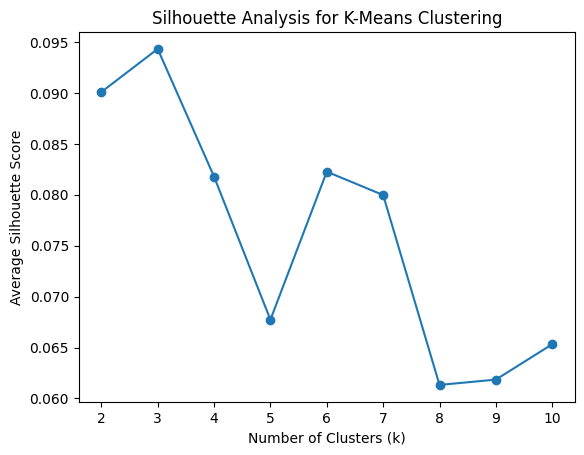

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt


k_values = range(2, 11)
silhouette_scores = []


for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(df_scaled)
    silhouette_avg = silhouette_score(df_scaled, labels)
    silhouette_scores.append(silhouette_avg)


plt.plot(k_values, silhouette_scores, marker='o')
plt.title('Silhouette Analysis for K-Means Clustering')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Average Silhouette Score')
plt.show()

**Elbow Method :**

To support our choice of K, we used the Elbow Method, which helps find the best number of clusters by looking at how the WSS (within-cluster sum of squares) changes as K increases.

In our plot, we saw that at K = 4, the decrease in WSS becomes much smaller, forming an "elbow" shape. This means that adding more clusters after 4 doesn’t improve the result much.

So, we selected K = 4 as a third option for clustering, along with K = 2 and K = 3.

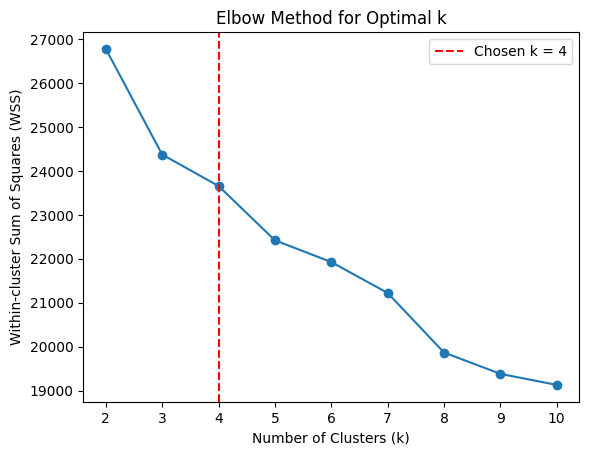

In [ ]:
%pip install Kneed
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from kneed import KneeLocator

wss_values = []

for k in k_values:
    kmeans = make_pipeline(StandardScaler(), KMeans(n_clusters=k))
    kmeans.fit(df_scaled)
    wss_values.append(kmeans.named_steps['kmeans'].inertia_)

plt.plot(k_values, wss_values, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-cluster Sum of Squares (WSS)')
plt.title('Elbow Method for Optimal k')
plt.axvline(x=4, linestyle='--', color='red', label='Chosen k = 4')
plt.legend()
plt.show()

**K-Means Clustering for K = 3**

We applied K-means clustering using K = 3, which was selected as the best choice based on the silhouette analysis.

After fitting the model, we printed the cluster centers and the assigned labels for each data point. To evaluate the clustering performance, we used the Silhouette Visualizer.

As shown in the silhouette plot, most data points had positive silhouette scores, which means they are generally well-matched with their assigned clusters. However, some points had scores close to zero or slightly negative, which suggests there is some overlap or uncertainty between a few clusters.

Cluster Centers:
[[-0.04844972 -0.01069193 -0.00579756 -0.00176196  0.0146775   0.06102582
   0.01135042 -0.00785149 -0.01861727  1.51484845 -0.02973257 -0.01064815]
 [ 0.21580466 -0.19971736  0.01181297  0.44125964 -0.30846056  0.22671647
  -0.13685791 -0.47121008 -0.20975077 -0.65413209 -0.14830553  0.45488158]
 [-0.12871769  0.16175615 -0.00463093 -0.33789775  0.22588271 -0.22115815
   0.09650507  0.36830518  0.17555484 -0.66013204  0.13684824 -0.34154813]]

Cluster Labels:
[2 2 1 ... 1 0 1]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


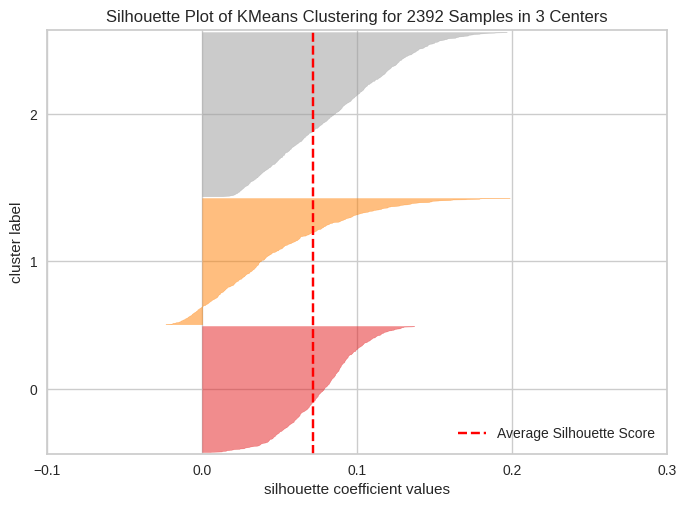

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 2392 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from yellowbrick.cluster import SilhouetteVisualizer



np.random.seed(5430)

kmeans = KMeans(n_clusters=3, random_state=5430, n_init='auto')
kmeans_result = kmeans.fit(df_scaled)


print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result.labels_)

visualizer = SilhouetteVisualizer(kmeans, color='yellowbrick')

visualizer.fit(df_scaled)
visualizer.show()

**Evaluation for K = 3**

we calculated two key metrics:

WSS (Within-Cluster Sum of Squares): which shows the overall compactness of the clusters. A lower WSS means the points are closer to their assigned cluster centers, The WSS value was 25097.4 , suggests moderate cluster separation and compactness.

Average Silhouette Score: The score was approximately 0.07, which shows a moderate level of separation between the two clusters, the result confirms that the clusters are well-formed, though some overlap or closeness between clusters may exist.

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pandas as pd


# Perform k-means clustering with k=3
kmeans = KMeans(n_clusters=3, random_state=5430, n_init='auto')
kmeans.fit(df_scaled)
labels = kmeans.labels_

# Compute the WSS (Within-Cluster Sum of Squares)
wss = kmeans.inertia_

# Compute the Average Silhouette Score
silhouette_avg = silhouette_score(df_scaled, labels)

# Print the evaluation metrics
print("WSS:", wss)
print("Average Silhouette Score:", silhouette_avg)

WSS: 25097.401658657956
Average Silhouette Score: 0.07134037126104951


**K-Means Clustering for K = 2**

We also applied K-means clustering using K = 2, which was the second-best choice based on the silhouette analysis.

Initially, when we used the default random_state=42, the algorithm assigned all data points to the same cluster (all labels were 0), which made the clustering meaningless.So, we increased the random state to 5430 to get more realistic and meaningful cluster assignments.

The model was successfully fitted, and we printed the cluster centers and labels. We also used the Silhouette Visualizer to evaluate the clustering quality. The plot showed that most samples had positive silhouette scores, indicating good separation between the two clusters.

Cluster Centers:
[[-0.0373759   0.0948477   0.09270264 -0.10379757  0.83772378  0.01959524
   0.15676438  0.1770012  -0.08907479  0.06041365  0.0337862  -0.14291904]
 [ 0.03408945 -0.08650778 -0.08455133  0.09467068 -0.76406302 -0.01787223
  -0.14298014 -0.16143754  0.08124248 -0.05510149 -0.03081539  0.13035222]]

Cluster Labels:
[0 0 1 ... 1 0 0]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


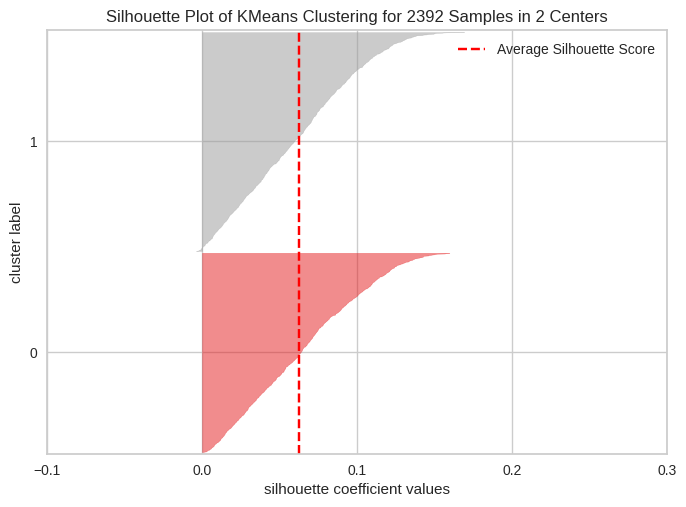

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 2392 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from yellowbrick.cluster import SilhouetteVisualizer



np.random.seed(5430)

kmeans = KMeans(n_clusters=2, random_state=5430, n_init='auto')
kmeans_result = kmeans.fit(df_scaled)


print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result.labels_)

visualizer = SilhouetteVisualizer(kmeans, color='yellowbrick')

visualizer.fit(df_scaled)
visualizer.show()

**Evaluation for K = 2**

we calculated two key metrics:

WSS (Within-Cluster Sum of Squares) was 26,912.85 , indicates that the clusters are less compact compared to higher value of K.

Average Silhouette Score was 0.0627, While most points were reasonably grouped, the relatively low score suggests that some overlap or ambiguity may exist between the clusters.

These metrics, along with the silhouette plot from the previous step, confirm that K = 2 is a valid configuration — even if not the strongest — and provides useful insights for comparison.

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pandas as pd


# Perform k-means clustering with k=2
kmeans = KMeans(n_clusters=2, random_state=5430, n_init='auto')
kmeans.fit(df_scaled)
labels = kmeans.labels_

# Compute the WSS (Within-Cluster Sum of Squares)
wss = kmeans.inertia_

# Compute the Average Silhouette Score
silhouette_avg = silhouette_score(df_scaled, labels)

# Print the evaluation metrics
print("WSS:", wss)
print("Average Silhouette Score:", silhouette_avg)

WSS: 26912.85104128798
Average Silhouette Score: 0.06275376474347227


**K-Means Clustering for K = 4**

We also applied K-means clustering with K = 4, which was selected based on the Elbow Method to explore additional clustering possibilities.

As shown in the silhouette plot, most data points had positive silhouette scores, indicating reasonable separation between clusters. However, several points were close to zero, and the silhouette bars for the four clusters appeared less compact and slightly overlapping.

Cluster Centers:
[[-5.66101635e-02 -2.83031962e-02 -3.87094833e-02  1.30326224e-03
   2.57869511e-02  7.64426642e-02  2.90551565e-02 -1.38219347e-02
  -2.98407920e-02  1.51484845e+00 -6.23023360e-02 -4.31865646e-01]
 [ 5.07228398e-02 -4.62644023e-04  3.11848004e-02  2.76931199e-02
  -3.84461724e-02 -4.29023865e-02 -1.17855503e-01 -1.39772898e-02
  -1.71968664e-02 -6.48098685e-03  3.98822222e-02  2.31553495e+00]
 [ 2.57537354e-02  1.79478027e-01  1.90528593e-01 -2.05814106e-01
   1.21545617e-01 -5.64549087e-01 -2.50462270e-01  1.98656271e-01
   7.52962650e-02 -6.50550628e-01  5.12936198e-01 -4.31865646e-01]
 [-2.86604386e-03 -1.44531907e-01 -1.62569203e-01  1.77864556e-01
  -1.15926682e-01  4.88219586e-01  2.71937696e-01 -1.67721489e-01
  -3.67004849e-02 -6.60132040e-01 -4.50070126e-01 -4.31865646e-01]]

Cluster Labels:
[2 2 3 ... 1 0 1]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


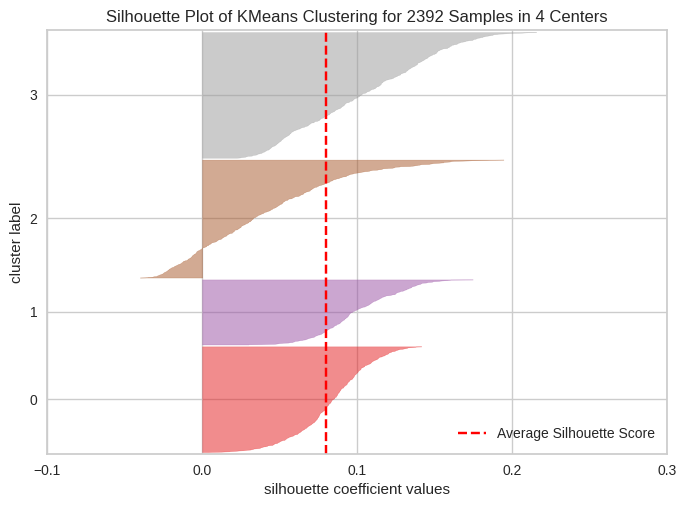

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 2392 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:

from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from yellowbrick.cluster import SilhouetteVisualizer



np.random.seed(5430)


kmeans = KMeans(n_clusters=4, random_state=5430, n_init='auto')
kmeans_result = kmeans.fit(df_scaled)


print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result.labels_)

visualizer = SilhouetteVisualizer(kmeans, color='yellowbrick')

visualizer.fit(df_scaled)
visualizer.show()

**Evaluation for K = 4:**

The Average Silhouette Score was 0.0797, indicating moderate separation between the clusters. This score suggests that the clusters are reasonably well-separated, but still exhibit some overlap.

The WSS (within-cluster sum of squares) was 23,270.92, which indicates that the clusters are compact and tightly grouped. The decrease in WSS shows that the algorithm is able to create more distinct and smaller clusters.

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pandas as pd


# Perform k-means clustering with k=4
kmeans = KMeans(n_clusters=4, random_state=5430, n_init='auto')
kmeans.fit(df_scaled)
labels = kmeans.labels_

# Compute the WSS (Within-Cluster Sum of Squares)
wss = kmeans.inertia_

# Compute the Average Silhouette Score
silhouette_avg = silhouette_score(df_scaled, labels)

# Print the evaluation metrics
print("WSS:", wss)
print("Average Silhouette Score:", silhouette_avg)

WSS: 23270.91675328171
Average Silhouette Score: 0.07973966739625381


# **Comparison and Evaluation for K = 2, 3, 4**
In this analysis, we applied K-means clustering for different values of K (2, 3, and 4) and evaluated the results based on Silhouette Score and WSS (Within-Cluster Sum of Squares).

Results: WSS:

K = 2: 26,912.85

K = 3: 25,097.40

K = 4: 23,270.92

Silhouette Score:

K = 2: 0.0627

K = 3: 0.0713

K = 4: 0.0797

Analysis of Results:

WSS (Within-Cluster Sum of Squares):

As K increased from 2 to 4, we observed that WSS decreased, indicating that the clusters became more compact.

K = 4 achieved the lowest WSS, showing that the clusters are tighter and closer to their centroids, indicating more precise partitioning of the data.

Silhouette Score:

Silhouette Score was highest for K = 4 compared to K = 2, indicating that K = 4 provides better separation between clusters.

K = 4 achieved the highest Silhouette Score at 0.0797, meaning the clusters were more distinctly separated compared to the other K values.

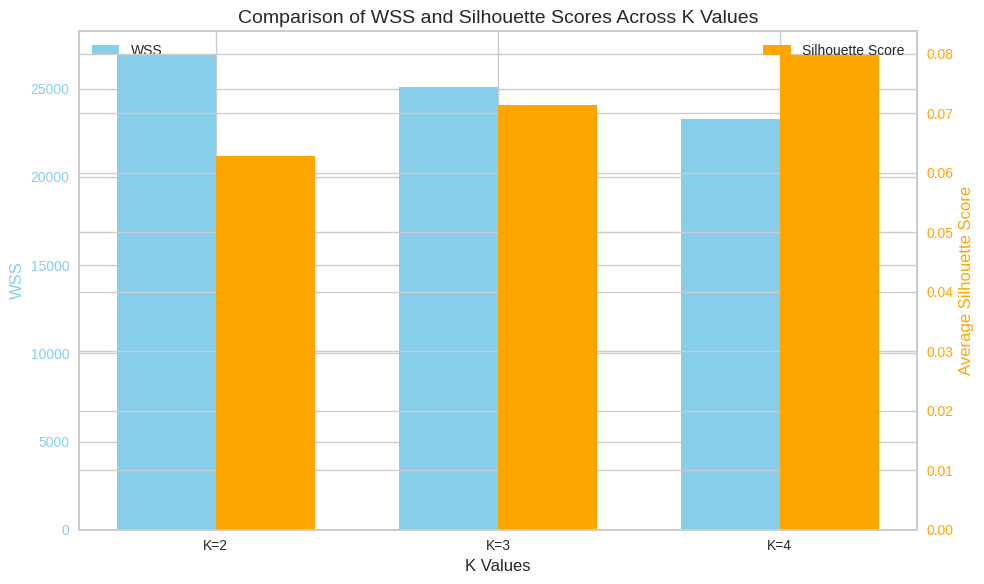

WSS: [26912.85104128798, 25097.401658657956, 23270.91675328171]
Average Silhouette Score: [np.float64(0.06275376474347227), np.float64(0.07134037126104951), np.float64(0.07973966739625381)]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Define k_values
k_values = [2, 3, 4]  # Reordered for logical flow
wss = []
silhouette_scores = []

# Loop to calculate WSS and Silhouette score for each k
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=5430, n_init='auto')
    kmeans_result = kmeans.fit(df_scaled)

    # Compute WSS (within-cluster sum of squares)
    wss.append(kmeans_result.inertia_)

    # Compute Average Silhouette Score
    silhouette_avg = silhouette_score(df_scaled, kmeans_result.labels_)
    silhouette_scores.append(silhouette_avg)

# Grouped Bar Chart
x = np.arange(len(k_values))  # the label locations
width = 0.35  # the width of the bars

fig, ax1 = plt.subplots(figsize=(10, 6))

# Bars for WSS
bar1 = ax1.bar(x - width/2, wss, width, label='WSS', color='skyblue')
ax1.set_xlabel('K Values', fontsize=12)
ax1.set_ylabel('WSS', color='skyblue', fontsize=12)
ax1.tick_params(axis='y', labelcolor='skyblue')
ax1.set_xticks(x)
ax1.set_xticklabels([f'K={k}' for k in k_values])
ax1.legend(loc='upper left')

# Add a secondary y-axis for Silhouette Scores
ax2 = ax1.twinx()
bar2 = ax2.bar(x + width/2, silhouette_scores, width, label='Silhouette Score', color='orange')
ax2.set_ylabel('Average Silhouette Score', color='orange', fontsize=12)
ax2.tick_params(axis='y', labelcolor='orange')
ax2.legend(loc='upper right')

# Title and Layout
plt.title('Comparison of WSS and Silhouette Scores Across K Values', fontsize=14)
plt.tight_layout()

plt.show()

# Printing the WSS and Silhouette Score for each K value
print("WSS:", wss)
print("Average Silhouette Score:", silhouette_scores)

**K = 4 is the best choice based on the results, as it achieved the highest Silhouette Score and the lowest WSS, indicating that the clusters are both more compact and better separated.**

# **6.Evaluation and Comparison:**

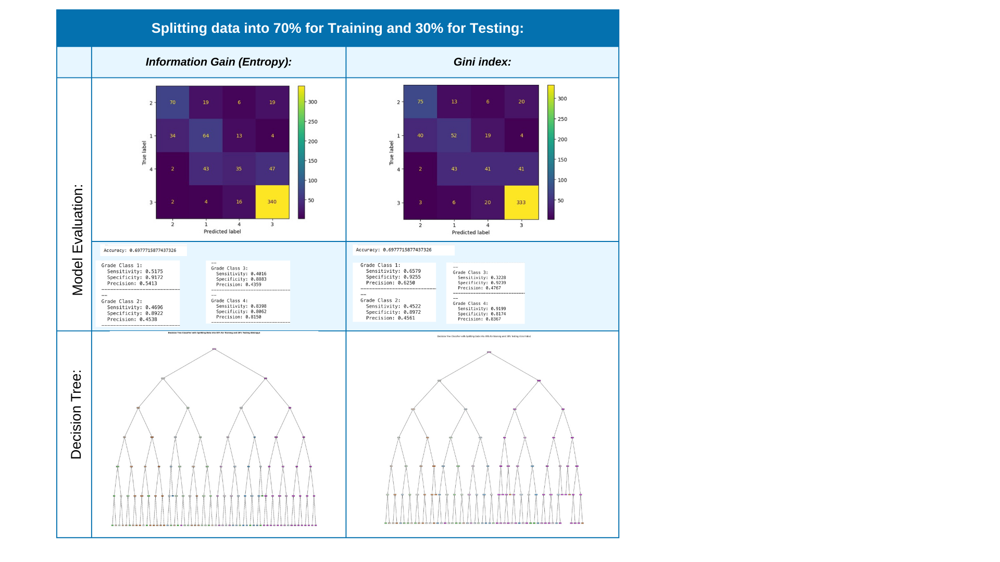

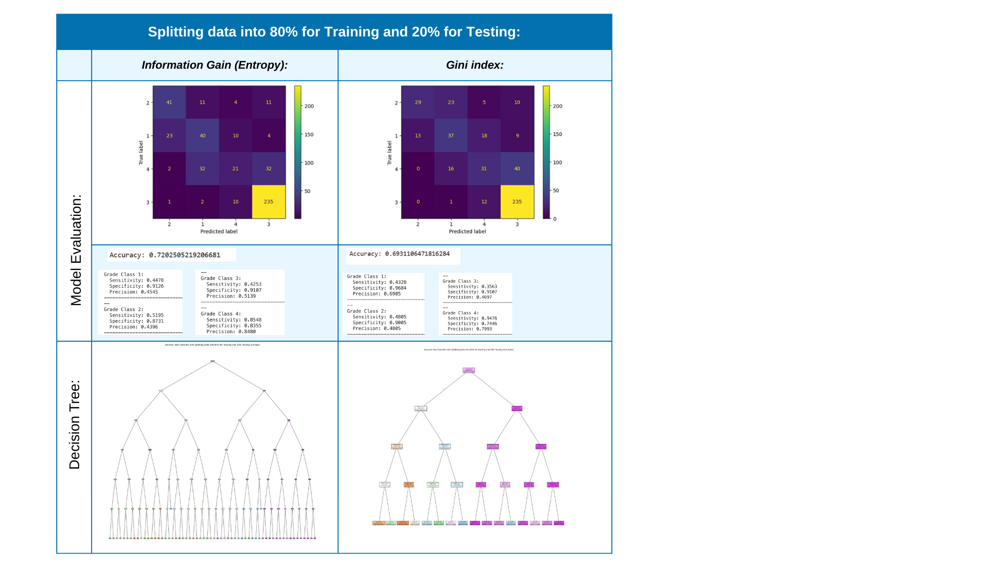

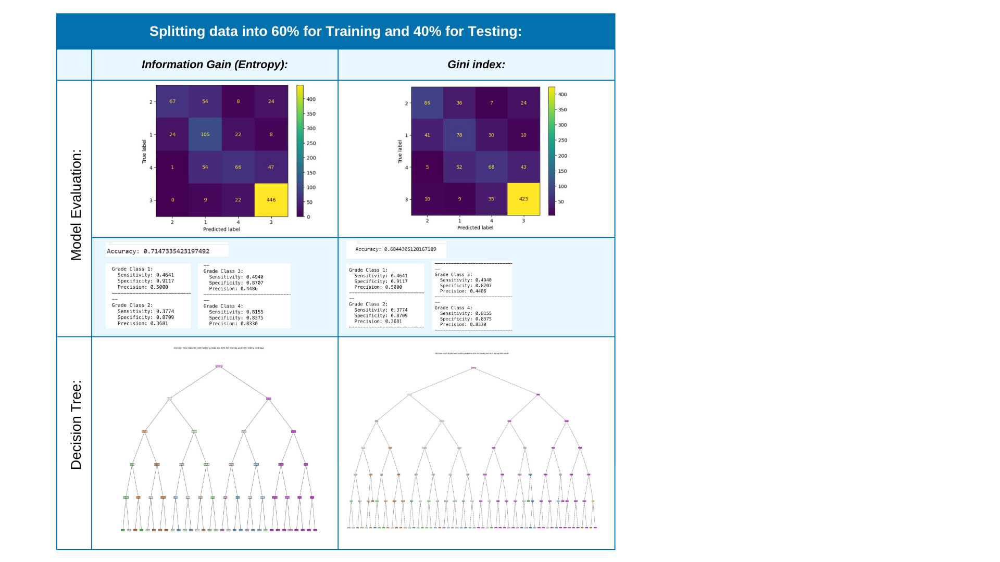

# Classification Evaluation:

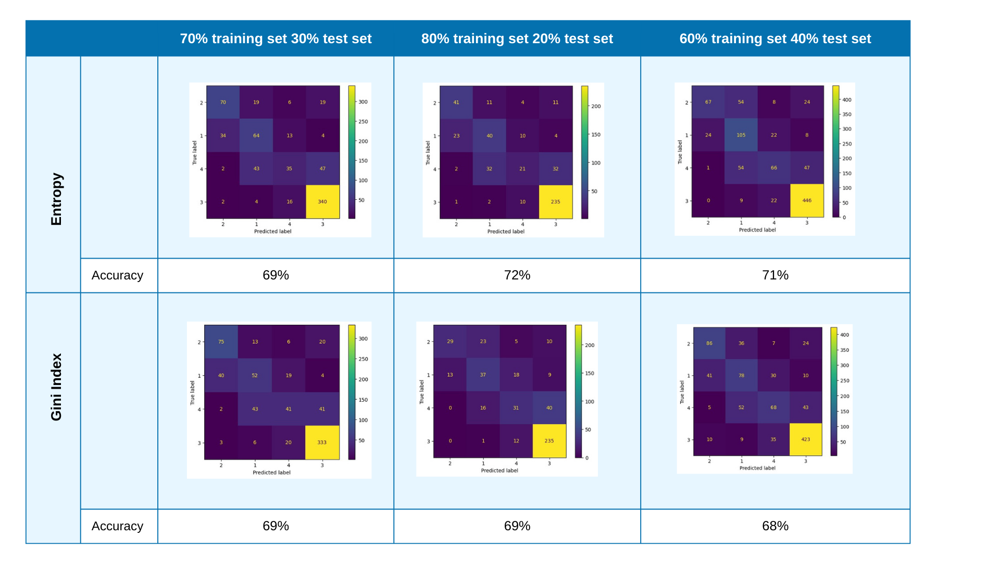

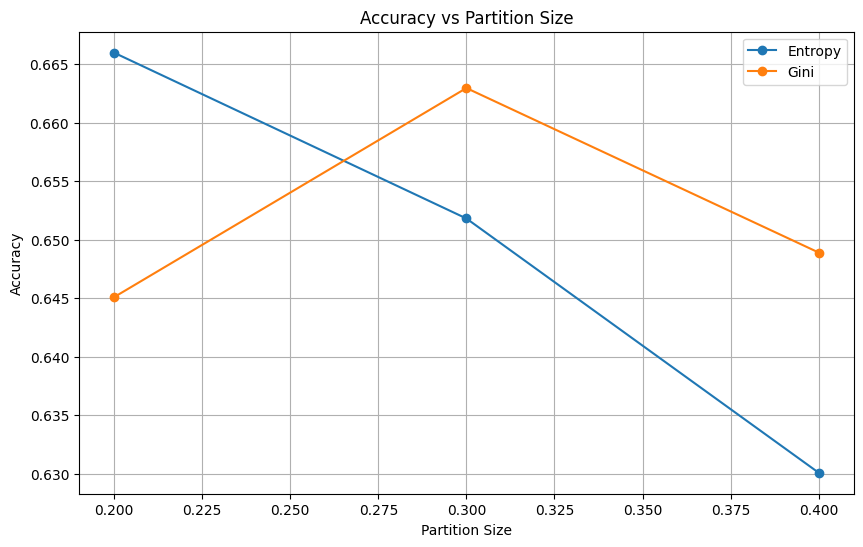

# Findings:

Information Gain (Entropy) starts with the highest accuracy among all partition sizes but shows a consistent decline as the partition size increases. In contrast, Gini Index improves initially, peaking at the middle partition size before slightly dropping again. This indicates that Entropy may be more effective with smaller training sizes, offering better initial performance, while Gini performs better at moderate partition sizes.

If the goal is maximizing accuracy at lower training sizes, Entropy is the better choice. However, for configurations where a balance in training and testing data is desired, Gini Index might offer more stable performance.

# Clustering Evaluation:

Number of cluster chosen:

K=4 , K=3 , K=2

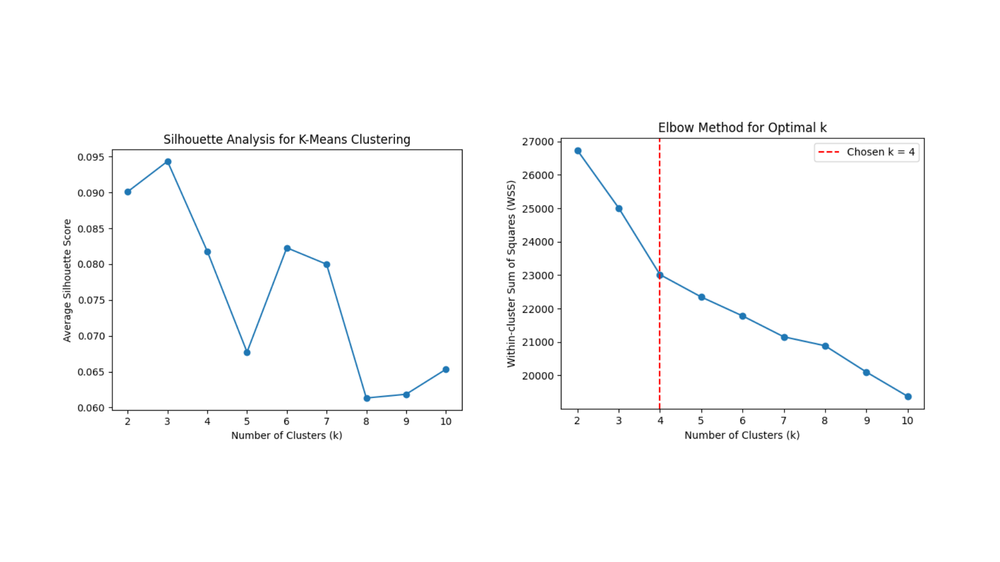

Cluster Figures:

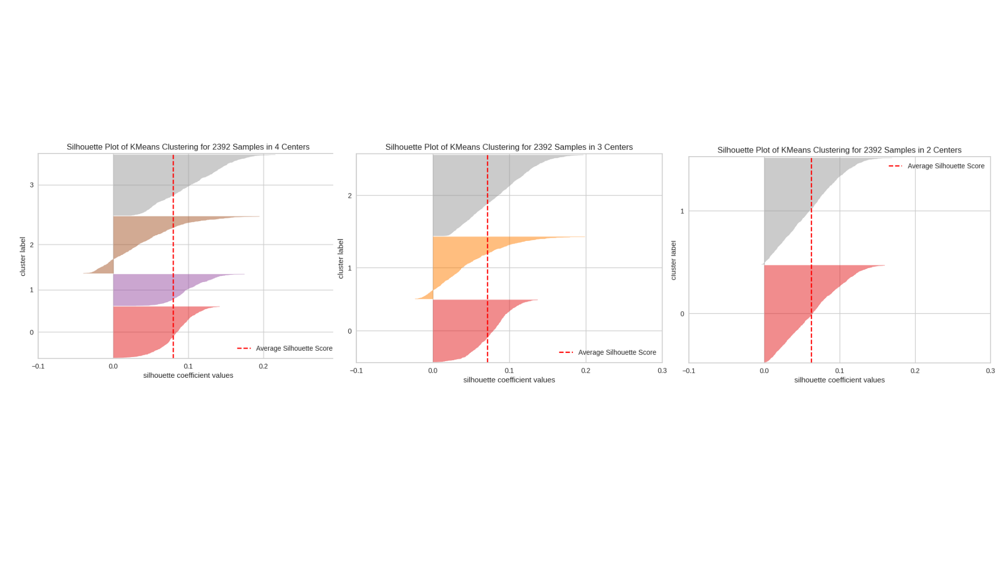

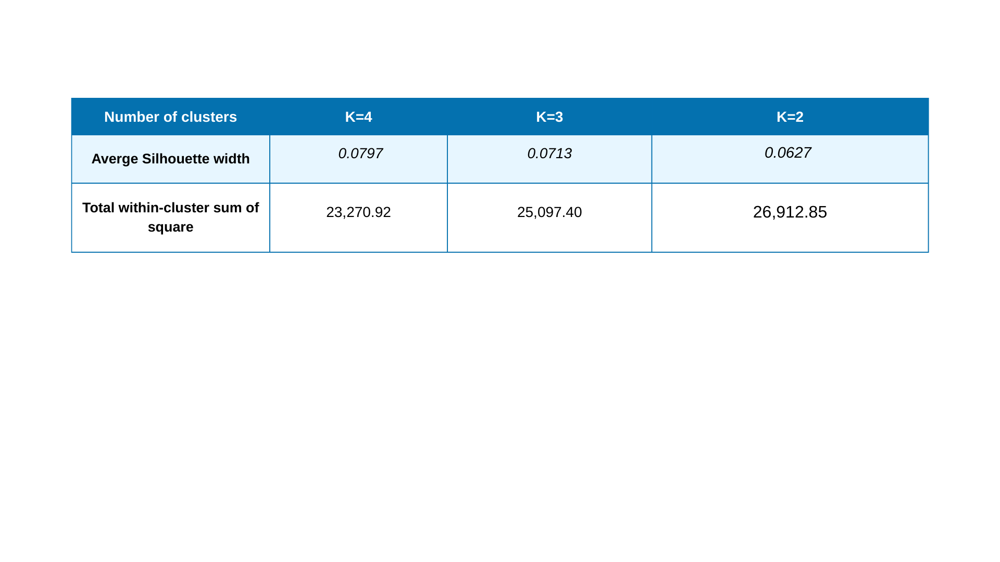

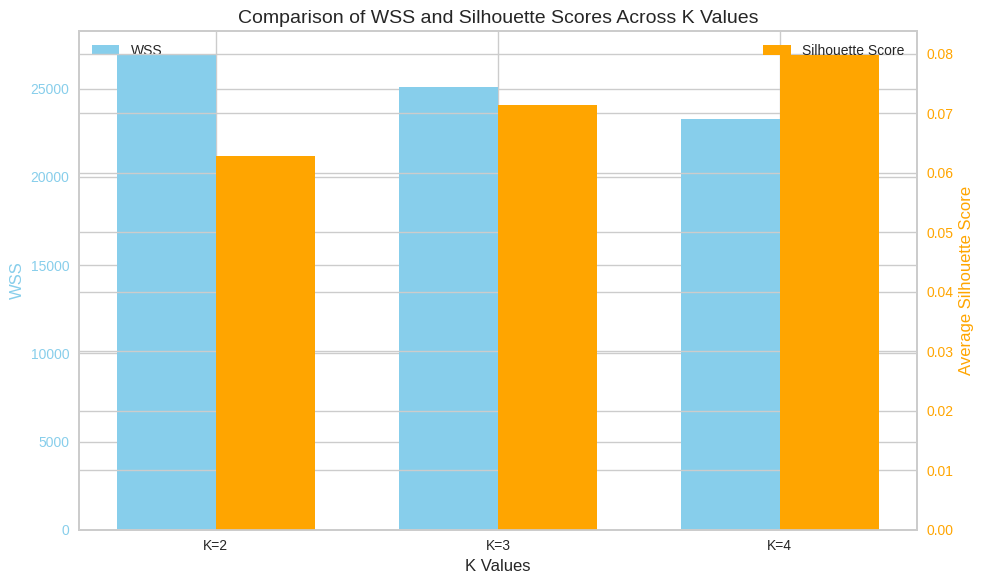

# Findings:

After evaluating the WSS and Silhouette Score metrics for different values of K, the optimal number of clusters for our model appears to be K=4. While K=2 showed the lowest WSS, the silhouette score increased as the number of clusters grew, with K=4 yielding the highest silhouette score of 0.0797. This indicates that K=4 produced the most distinct and cohesive clusters, offering a balance between compactness and separation.

Additionally, when considering the nature of the dataset and the clustering results, K=4 provided a more meaningful and interpretable separation of the data. This suggests that the model benefits from splitting the data into four groups, as it achieves better separation between them, offering better insights into the underlying patterns of student performance.



# **7.Findings:**

We began by selecting a dataset that focuses on high school student performance, aiming to predict their academic grades using educational data mining techniques. The dataset includes demographic features (such as age, gender, and parental education), behavioral factors (like study hours and extracurricular activities), and academic history.

To prepare the data, we merged relevant sources and cleaned the dataset by removing duplicates and handling missing values through strategies like mean imputation for numerical features. We also encoded categorical variables into numerical formats and normalized continuous variables, particularly to ensure fair contribution during clustering. The dataset was then split into training and testing sets using a standard 70%/30% split.

Exploratory Data Analysis (EDA) was conducted to understand the relationships among variables. We used histograms and boxplots to assess distributions and outliers, heatmaps to explore correlations, and bar plots to compare grade categories. Our findings showed that study hours, parental education, and academic support activities had a strong positive correlation with higher student grades, while high absenteeism and low engagement negatively impacted performance.

After preprocessing, we applied both classification and clustering models. For classification, we used Decision Tree models with both Entropy and Gini Index as splitting criteria. We compared multiple training/testing ratios, finding that the Entropy-based tree with a 70%/30% split offered the best balance of accuracy, specificity, and interpretability. In this tree, “study hours” was selected as the root node, followed by features like “mother’s education” and “academic support”, highlighting their importance in predicting grade class (A, B, C, D). The Entropy tree also generated fewer branches than Gini, making it simpler to interpret while maintaining strong predictive performance.

For clustering, we employed K-Means to explore natural groupings of students without using the grade label. We tested different values of K and used the Elbow Method and Silhouette Score to determine the optimal number of clusters. The results indicated that K=4 provided the clearest separation, aligning approximately with academic performance categories. Cluster profiles revealed patterns such as high-performing students with strong study habits and support, and lower-performing students with fewer study hours and higher absenteeism.

Overall, both models provided valuable insights. The Decision Tree classifier proved highly effective in accurately predicting grade categories, making it the most suitable tool for our goal of forecasting student performance. Meanwhile, K-Means clustering offered an unsupervised perspective on student groupings and highlighted hidden structures within the data. This dual approach enhanced our understanding of academic success factors and provided actionable insights for educational improvement.

# **8. References**

[1] R. El Kharoua, Students Performance Dataset, Kaggle, 2024. [Online]. Available: https://www.kaggle.com/datasets/rabieelkharoua/students-performance-dataset/code

[2] College of Computer Science, Department of Information Technology, King Saud University, “Labs and Lecture Slides,” [Online]. Available: https://lms.ksu.edu.sa/

[3] J. Han, J. Pei, and H. Tong, Data Mining: Concepts and Techniques, 4th ed., Morgan Kaufmann, 2022